Data loaded successfully and ready for PCA processing.
Data shape: (210, 210, 1340)
Data type: float32
EELS SI Data Asset Information:
-------------------------------
Signal type: <class 'exspy.signals.eels.EELSSpectrum'>
Data shape: (210, 210, 1340)
Data type: float32

Signal Properties:
Number of dimensions: (210, 210, 1340)
Navigation dimensions: 2
Signal dimensions: 1
Navigation shape: (210, 210)
Signal shape: (1340,)

Axes Information:
Axis 0:
  Name: x
  Size: 210
  Units: 
  Scale: 1.0
  Offset: -0.0
  Is navigation: True
Axis 1:
  Name: y
  Size: 210
  Units: 
  Scale: 1.0
  Offset: -0.0
  Is navigation: True
Axis 2:
  Name: Energy loss
  Size: 1340
  Units: eV
  Scale: 0.30000001192092896
  Offset: 420.00001668930054
  Is navigation: False


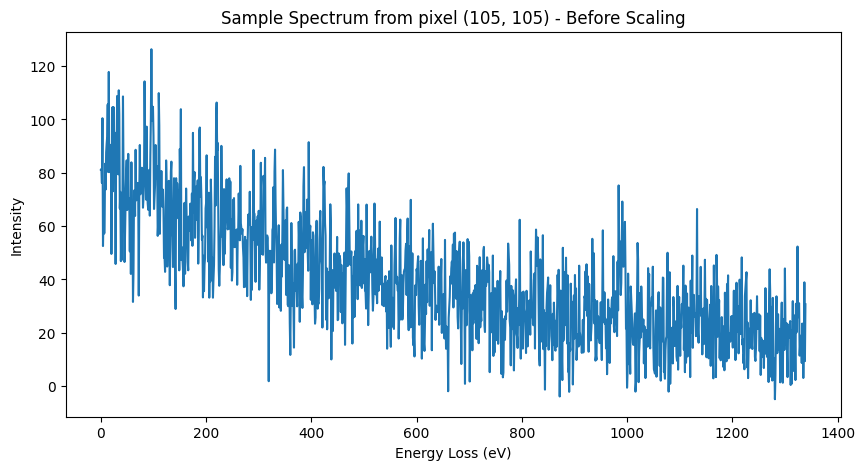

Scaling parameters: {'q_low': -18.2849796541214, 'q_high': 139.14496636580395}
Scaled data shape: (210, 210, 1340)
Scaled data type: float32


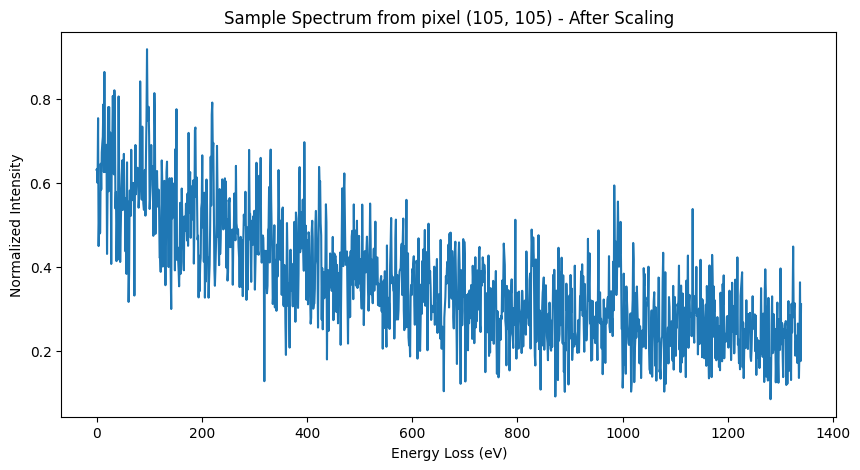

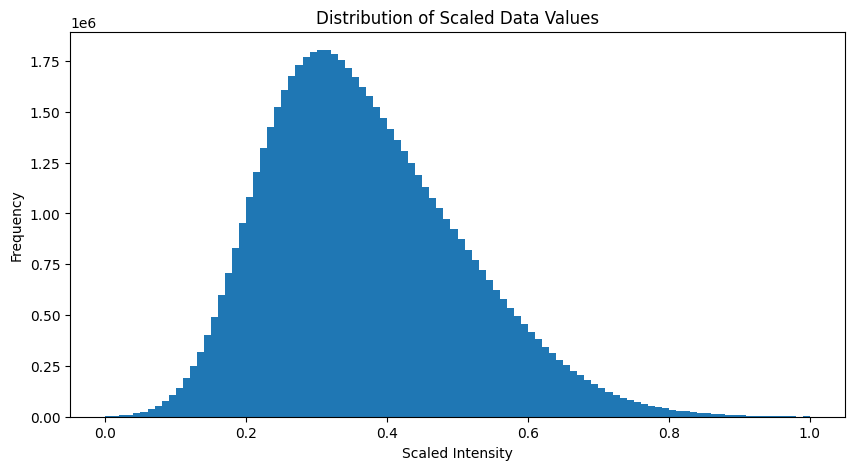

In [1]:
import hyperspy.api as hs
import matplotlib.pyplot as plt
import numpy as np
from skimage.filters import gaussian
import pywt

def robust_minmax_scale(data, low_percentile=0.005, high_percentile=99.995):
    """
    Perform robust min-max scaling on the input data.
    
    :param data: Input data as a numpy array
    :param low_percentile: Lower percentile for scaling (default: 1)
    :param high_percentile: Upper percentile for scaling (default: 99)
    :return: Scaled data and a dict with scaling parameters
    """
    q_low, q_high = np.percentile(data, [low_percentile, high_percentile])
    scaled_data = (data - q_low) / (q_high - q_low)
    scaled_data = np.clip(scaled_data, 0, 1)
    return scaled_data, {'q_low': q_low, 'q_high': q_high}

def print_data_info(signal):
    print("EELS SI Data Asset Information:")
    print("-------------------------------")
    
    # Basic information
    print(f"Signal type: {type(signal)}")
    print(f"Data shape: {signal.data.shape}")
    print(f"Data type: {signal.data.dtype}")
    
    # Signal properties
    print("\nSignal Properties:")
    try:
        print(f"Number of dimensions: {signal.axes_manager.shape}")
    except AttributeError:
        print("Number of dimensions: Not available")
    
    try:
        print(f"Navigation dimensions: {len(signal.axes_manager.navigation_axes)}")
        print(f"Signal dimensions: {len(signal.axes_manager.signal_axes)}")
    except AttributeError:
        print("Navigation/Signal dimensions: Not available")
    
    try:
        print(f"Navigation shape: {signal.axes_manager.navigation_shape}")
        print(f"Signal shape: {signal.axes_manager.signal_shape}")
    except AttributeError:
        print("Navigation/Signal shape: Not available")
    
    # Axes information
    print("\nAxes Information:")
    for i in range(len(signal.data.shape)):
        print(f"Axis {i}:")
        try:
            axis = signal.axes_manager[i]
            print(f"  Name: {getattr(axis, 'name', 'N/A')}")
            print(f"  Size: {getattr(axis, 'size', signal.data.shape[i])}")
            print(f"  Units: {getattr(axis, 'units', 'N/A')}")
            print(f"  Scale: {getattr(axis, 'scale', 'N/A')}")
            print(f"  Offset: {getattr(axis, 'offset', 'N/A')}")
            print(f"  Is navigation: {getattr(axis, 'navigate', 'N/A')}")
        except:
            print("  Unable to retrieve axis information")

def wavelet_denoise(spectrum, wavelet='db4', level=2, threshold=None):
    """
    Denoise EELS spectrum using wavelet transform
    
    Parameters:
    spectrum: array-like, input spectrum
    wavelet: str, wavelet type
    level: int, decomposition level
    threshold: float, custom threshold for coefficient suppression
    
    Returns:
    array-like: Denoised spectrum
    """
    # Decompose
    coeffs = pywt.wavedec(spectrum, wavelet, level=level)
    
    # Threshold determination if not provided
    if threshold is None:
        threshold = np.sqrt(2 * np.log(len(spectrum))) * np.std(coeffs[-1])
    
    # Apply soft thresholding
    coeffs_thresholded = list(coeffs)
    for i in range(1, len(coeffs)):
        coeffs_thresholded[i] = pywt.threshold(coeffs[i], threshold, mode='soft')
    
    # Reconstruct
    return pywt.waverec(coeffs_thresholded, wavelet)

# Path to your data file
data_path = '/home/ssulta24/Desktop/VCAE/data/images_3D/BFO_a-0090 (dark ref corrected).dm3'

# Load the data
SI_raw = hs.load(data_path, signal_type="EELS")

# Print basic information about the dataset
print("Data loaded successfully and ready for PCA processing.")
print(f"Data shape: {SI_raw.data.shape}")
print(f"Data type: {SI_raw.data.dtype}")

# Print information about the loaded data
print_data_info(SI_raw)
SI_raw.metadata

# Plot a sample spectrum from the center of the image (before scaling)
center_x, center_y = SI_raw.data.shape[0] // 2, SI_raw.data.shape[1] // 2
plt.figure(figsize=(10, 5))
plt.plot(SI_raw.data[center_x, center_y, :])
plt.title(f"Sample Spectrum from pixel ({center_x}, {center_y}) - Before Scaling")
plt.xlabel("Energy Loss (eV)")
plt.ylabel("Intensity")
plt.show()

# Perform robust min-max scaling
SI_raw.data = SI_raw.data.astype(np.float32)  # Convert to float for scaling
SI_raw.data, scaling_params = robust_minmax_scale(SI_raw.data)

# sigma = 0.5
# SI_raw.data = gaussian(SI_raw.data, sigma, mode='reflect', preserve_range=True)
# print(f"Data was robustly scaled and gaussian of {sigma} has been applied")

print(f"Scaling parameters: {scaling_params}")
print(f"Scaled data shape: {SI_raw.data.shape}")
print(f"Scaled data type: {SI_raw.data.dtype}")

# Plot the same sample spectrum after scaling
plt.figure(figsize=(10, 5))
plt.plot(SI_raw.data[center_x, center_y, :])
plt.title(f"Sample Spectrum from pixel ({center_x}, {center_y}) - After Scaling")
plt.xlabel("Energy Loss (eV)")
plt.ylabel("Normalized Intensity")
plt.show()

data = SI_raw.data

# Optional: If you want to see the overall distribution of values after scaling
plt.figure(figsize=(10, 5))
plt.hist(data.ravel(), bins=100)
plt.title("Distribution of Scaled Data Values")
plt.xlabel("Scaled Intensity")
plt.ylabel("Frequency")
plt.show()

In [3]:
from anomaly_detection.data.data_loader_V2 import EELSDataset
from anomaly_detection.config.config_handler import get_config

# Load your configuration
config = get_config('/home/ssulta24/Desktop/VCAE_new/anomaly_detection/config/config.yaml')

data = EELSDataset(config)
dataset = data.get_preprocessed_data()
SI_dataloader = hs.signals.Signal1D(dataset)

# anom_dataset = data.get_anomaly_sub_images()
# anom_dataset = anom_dataset.squeeze(axis=1)
# anom_dataset.shape

energy_values = data.get_cropped_energy_values()
print(f"Energy range: {energy_values[0]} to {energy_values[-1]} eV, Length: {len(energy_values)}")

Energy range: 423.30001682043076 to 816.6000324487686 eV, Length: 1312


Decomposition info:
  normalize_poissonian_noise=False
  algorithm=sklearn_pca
  output_dimension=None
  centre=None
scikit-learn estimator:
PCA()


<Figure size 500x500 with 0 Axes>

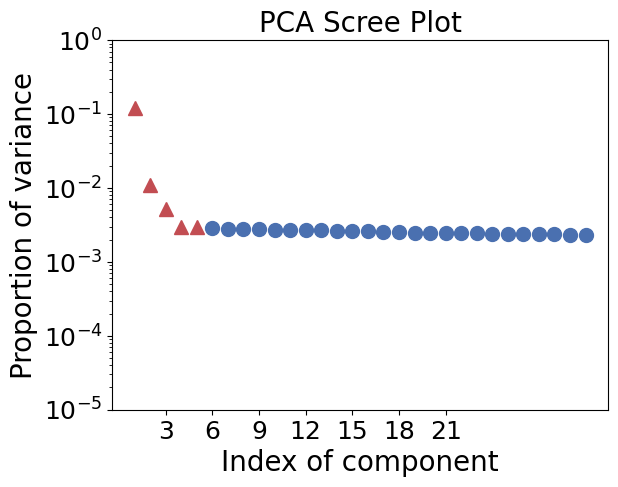

In [4]:
#PCA AND PLOTTING
fig=plt.figure(figsize=(5,5))
SI_dataloader.decomposition(algorithm="sklearn_pca")

# THRESHOLD IS THE NUMBER OF COMPONENETS
ax = SI_dataloader.plot_explained_variance_ratio(n=30,threshold=5,xaxis_type='number')
ax.set_title("PCA Scree Plot",fontsize=20)
ax.set_xlabel('Index of component',fontsize=20)
ax.set_ylabel('Proportion of variance',fontsize=20)
ax.set_xticks([3,6,9,12,15,18,21])
ax.set_xticklabels([3,6,9,12,15,18,21],fontsize=18)
ax.set_yticks([1,0.1,0.01,0.001,0.0001,0.00001])
ax.set_yticklabels(['10$^0$','10$^{-1}$','10$^{-2}$','10$^{-3}$','10$^{-4}$','10$^{-5}$'],fontsize=18)

#CHOOSE THE NUMBER OF COMPONENTS TO CONSTRUCT YOUR DATA
SI_pca = SI_dataloader.get_decomposition_model(5);

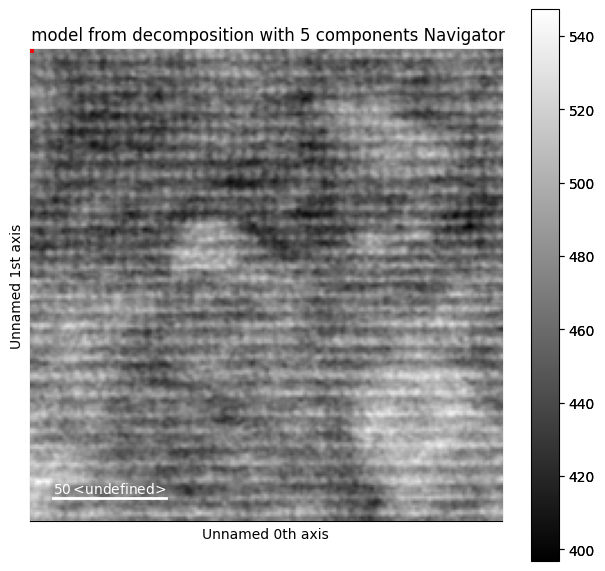

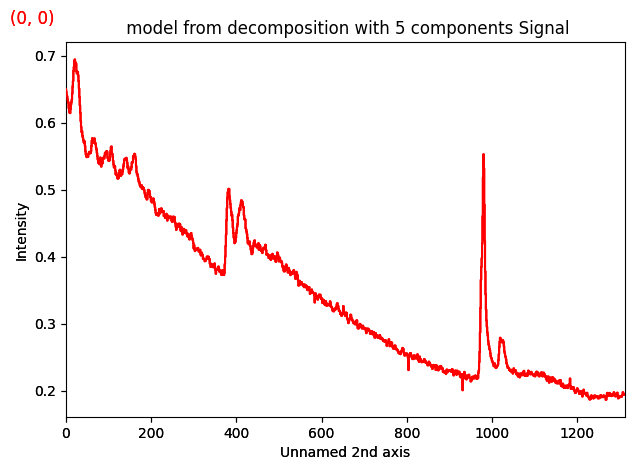

In [7]:
SI_pca.plot()

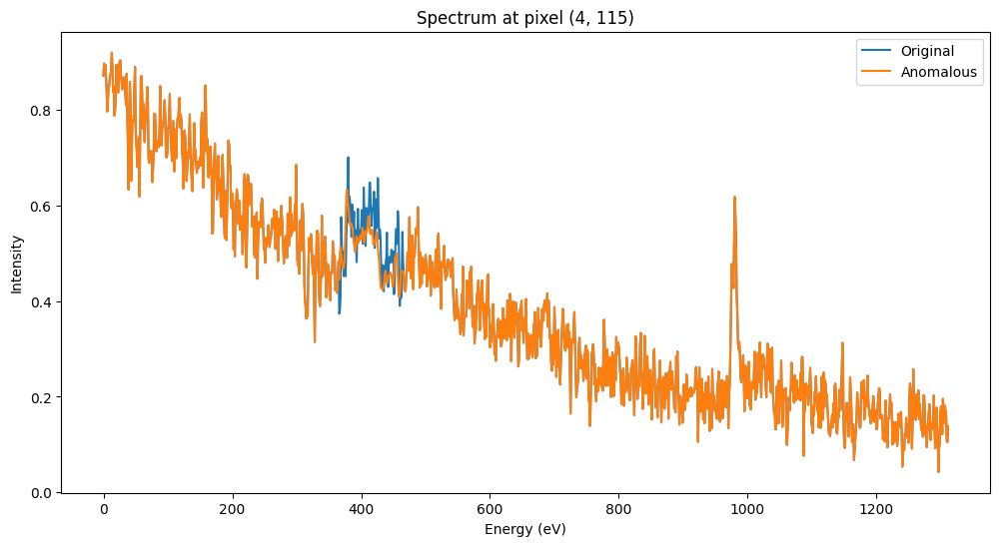

In [9]:
import numpy as np
from scipy import signal
from scipy.ndimage import gaussian_filter1d
from scipy.signal import fftconvolve
import matplotlib.colors as mcolors

import numpy as np
from scipy import signal
import matplotlib.pyplot as plt

def find_peaks(spectrum, prominence=0.1, distance=1, plot=False):
    """
    Find peaks in the spectrum using scipy's find_peaks function.
    
    Args:
    spectrum (numpy.ndarray): The input spectrum
    prominence (float): Minimum prominence of the peaks (relative to the maximum intensity)
    distance (int): Minimum distance between peaks
    plot (bool): If True, plot the spectrum with detected peaks
    
    Returns:
    tuple: (peak_positions, peak_properties)
    """
    prominence = prominence * np.max(spectrum)
    peaks, properties = signal.find_peaks(spectrum, prominence=prominence, distance=distance)
    
    if plot:
        plot_spectrum_with_peaks(spectrum, peaks, properties)
    
    return peaks, properties

def plot_spectrum_with_peaks(spectrum, peaks, properties):
    """
    Plot the spectrum with detected peaks.
    
    Args:
    spectrum (numpy.ndarray): The input spectrum
    peaks (numpy.ndarray): Array of peak indices
    properties (dict): Properties of the peaks
    """
    plt.figure(figsize=(12, 6))
    plt.plot(spectrum)
    plt.plot(peaks, spectrum[peaks], "x")
    
    # Highlighting the most prominent peak
    most_prominent = peaks[np.argmax(properties['prominences'])]
    plt.plot(most_prominent, spectrum[most_prominent], "o", color='red', markersize=10)
    
    plt.title("Spectrum with Detected Peaks (Red circle: Most Prominent)")
    plt.xlabel("Channel")
    plt.ylabel("Intensity")
    plt.show()

def find_main_peak(spectrum, plot=False):
    """
    Find the main peak in the spectrum based on highest prominence.
    
    Args:
    spectrum (numpy.ndarray): The input spectrum
    plot (bool): If True, plot the spectrum with the main peak
    
    Returns:
    int: The index of the main peak
    """
    peaks, properties = find_peaks(spectrum, prominence=0.1, distance=10)
    if len(peaks) == 0:
        main_peak = np.argmax(spectrum)
    else:
        # Select the peak with the highest prominence
        main_peak = peaks[np.argmax(properties['prominences'])]
    
    if plot:
        plot_spectrum_with_peaks(spectrum, [main_peak], {'prominences': [properties['prominences'][np.argmax(properties['prominences'])]]})
    
    return main_peak

def inject_controlled_anomalies(image, anomaly_specs, energy_range=None):
    """
    Inject controlled anomalies into the EELS image.
    
    Args:
    image (numpy.ndarray): Input image of shape (height, width, energy_channels)
    anomaly_specs (list): List of tuples specifying anomalies. Each tuple can be either:
        - (type, count, cluster_size) for basic usage
        - (type, count, cluster_size, dict) where dict contains specific parameters
    energy_range (numpy.ndarray, optional): Energy values for oxygen deficiency simulation
    
    Returns:
    tuple: (anomalous_image, anomaly_mask)
    """
    anomalous_image = np.copy(image)
    height, width, _ = image.shape
    anomaly_mask = np.zeros((height, width), dtype=int)
    
    anomaly_funcs = {
        'peak_shift': peak_shift,
        'peak_broadening': peak_broadening,
        'intensity_fluctuation': intensity_fluctuation,
        'background_slope': background_slope,
        'noise_injection': noise_injection,
        'multiple_scattering': multiple_scattering,
        'cosmic_ray': cosmic_ray,
        'oxygen_deficiency': simulate_oxygen_deficiency  # Add new function
    }
    
    anomaly_colors = {
        'peak_shift': 1,
        'peak_broadening': 2,
        'intensity_fluctuation': 3,
        'background_slope': 4,
        'noise_injection': 5,
        'multiple_scattering': 6,
        'cosmic_ray': 7,
        'oxygen_deficiency': 8,  # Add new color code
    }
    
    for spec in anomaly_specs:
        # Unpack specifications
        if len(spec) == 4:
            anomaly_type, count, cluster_size, params = spec
        else:
            anomaly_type, count, cluster_size = spec
            params = {}
        
        for _ in range(count):
            if anomaly_type == 'cosmic_ray':
                # Handle cosmic ray as before
                while True:
                    y = np.random.randint(0, height)
                    x = np.random.randint(0, width)
                    if anomaly_mask[y, x] == 0:
                        anomaly_mask[y, x] = anomaly_colors[anomaly_type]
                        anomalous_image[y, x] = anomaly_funcs[anomaly_type](
                            anomalous_image[y, x], **params)
                        break
            else:
                # For other anomaly types, including oxygen_deficiency
                while True:
                    center_y = np.random.randint(cluster_size, height - cluster_size)
                    center_x = np.random.randint(cluster_size, width - cluster_size)
                    
                    if cluster_size == 1:
                        y_start, y_end = center_y, center_y + 1
                        x_start, x_end = center_x, center_x + 1
                    else:
                        y_start, y_end = center_y - cluster_size // 2, center_y + cluster_size // 2
                        x_start, x_end = center_x - cluster_size // 2, center_x + cluster_size // 2
                    
                    if np.all(anomaly_mask[y_start:y_end, x_start:x_end] == 0):
                        anomaly_mask[y_start:y_end, x_start:x_end] = anomaly_colors[anomaly_type]
                        for y in range(y_start, y_end):
                            for x in range(x_start, x_end):
                                if anomaly_type == 'oxygen_deficiency' and energy_range is not None:
                                    anomalous_image[y, x] = anomaly_funcs[anomaly_type](
                                        anomalous_image[y, x], energy_range, **params)
                                else:
                                    anomalous_image[y, x] = anomaly_funcs[anomaly_type](
                                        anomalous_image[y, x], **params)
                        break
    
    return anomalous_image, anomaly_mask

def simulate_oxygen_deficiency(original_spec, energy_range=energy_values, deficiency_level=0.1, ok_edge_start=533):
    """
    Simulate oxygen deficiency with effects only applied to O K-edge region and beyond
    
    Parameters:
    -----------
    original_spec : array-like
        Original XAS spectrum
    energy_range : array-like
        Energy values
    deficiency_level : float
        Degree of oxygen deficiency to simulate (0-1)
    ok_edge_start : float
        Energy value where O K-edge region starts
    """
    # Create mask for O K-edge region and beyond
    ok_edge_mask = (energy_range >= ok_edge_start) & (energy_range <= ok_edge_start + 30)
    
    # Create modified spectrum
    modified_spec = original_spec.copy()
    
    # Only apply effects to O K-edge region
    edge_energies = energy_range[ok_edge_mask]
    edge_spec = modified_spec[ok_edge_mask]
    
    # Normalize the O K-edge portion
    edge_spec = (edge_spec - np.min(edge_spec)) / (np.max(edge_spec) - np.min(edge_spec))
    
    # Create energy normalization only for O K-edge region
    energy_normalized = (edge_energies - np.min(edge_energies)) / (np.max(edge_energies) - np.min(edge_energies))
    
    # Create sigmoid transitions for amplitude reduction
    sigmoid1 = 1 / (1 + np.exp(-(energy_normalized - 0.3) * 10))
    sigmoid2 = 1 / (1 + np.exp(-(energy_normalized - 0.6) * 15))
    
    # Combine sigmoids for complex amplitude reduction pattern
    amplitude_factor = 1 - (deficiency_level * (0.7 * sigmoid1 + 0.3 * sigmoid2))
    
    # Apply amplitude reduction only to edge region
    edge_spec *= amplitude_factor
    
    # Apply gaussian blur with varying sigma only to edge region
    sigma = deficiency_level * (0.5 + energy_normalized * 3.0)
    edge_spec = gaussian_filter1d(edge_spec, sigma=np.max(sigma))
    
    # Apply small shift only to edge region
    shift_amount = int(deficiency_level * 8)
    edge_spec = np.roll(edge_spec, -shift_amount)
    if shift_amount > 0:
        edge_spec[-shift_amount:] = edge_spec[-(shift_amount+1)]
    
    # Rescale edge_spec back to original range
    edge_range = np.max(original_spec[ok_edge_mask]) - np.min(original_spec[ok_edge_mask])
    edge_min = np.min(original_spec[ok_edge_mask])
    edge_spec = (edge_spec * edge_range) + edge_min
    
    # Insert modified edge region back into spectrum
    modified_spec[ok_edge_mask] = edge_spec
    
    return modified_spec

def peak_shift(spectrum, shift_value=25, window_size=20): 
    """
    Apply peak shift to the spectrum.
    
    Args:
    spectrum (numpy.ndarray): The input spectrum
    shift_value (int, optional): If provided, shift will be randomly +/- this value
    window_size (int): Size of the window around the peak to apply the shift
    
    Returns:
    numpy.ndarray: The shifted spectrum
    """
    peak_pos = find_main_peak(spectrum)
    
    # Randomly choose between positive and negative shift
    shift = shift_value * (2 * np.random.randint(0, 2) - 1)  # Returns either +shift_value or -shift_value
    window = slice(max(0, peak_pos - window_size), min(len(spectrum), peak_pos + window_size + 1))
    shifted_spectrum = np.roll(spectrum[window], shift)
    spectrum[window] = shifted_spectrum
    return spectrum

def peak_broadening(spectrum, max_sigma=5): # WORKS OK
    peak_pos = find_main_peak(spectrum)
    window_size = 51  # Adjust this value based on your typical peak widths
    window = slice(max(0, peak_pos - window_size//2), min(len(spectrum), peak_pos + window_size//2 + 1))
    peak_region = spectrum[window]
    sigma = np.random.uniform(0, max_sigma)
    x = np.arange(-window_size//2, window_size//2 + 1)
    gaussian = np.exp(-x**2 / (2 * sigma**2))
    gaussian /= gaussian.sum()
    broadened_peak = fftconvolve(peak_region, gaussian, mode='same')
    broadened_peak *= np.sum(peak_region) / np.sum(broadened_peak)
    result = spectrum.copy()
    result[window] = broadened_peak
    return result

def intensity_fluctuation(spectrum, scale_range=None): # WORKS WELL 
    """
    Apply intensity fluctuation to the spectrum.
    
    Args:
    spectrum (numpy.ndarray): The input spectrum
    scale_range (tuple): A tuple of (min_scale, max_scale). If None, default to (0.8, 1.2)
    
    Returns:
    numpy.ndarray: The spectrum with intensity fluctuation applied
    """
    if scale_range is None:
        scale_range = (0.8, 1.2)
    scale = np.random.uniform(scale_range[0], scale_range[1])
    return spectrum * scale

def background_slope(spectrum, max_slope=0.00013): # WORKS WELL 
    slope = np.random.uniform(-max_slope, max_slope)
    background = np.arange(len(spectrum)) * slope
    return spectrum + background

def noise_injection(spectrum, poisson_factor=0.0005, gaussian_std=0.09): # WORKS WELL 
    poisson_noise = np.random.poisson(poisson_factor * spectrum)
    gaussian_noise = np.random.normal(0, gaussian_std * np.mean(spectrum), len(spectrum))
    return spectrum + poisson_noise + gaussian_noise

def multiple_scattering(spectrum, scattering_factor=0.1): # WORKS WELL 
    convolved = np.convolve(spectrum, spectrum, mode='same')
    return spectrum + scattering_factor * convolved / np.max(convolved)

def cosmic_ray(spectrum, intensity_factor=10, width=3): # WORKS WELL 
    """
    Add a cosmic ray spike to the spectrum.
    
    Args:
    spectrum (numpy.ndarray): The input spectrum
    intensity_factor (float): Factor to determine the intensity of the cosmic ray
    width (int): Width of the cosmic ray peak
    
    Returns:
    numpy.ndarray: The spectrum with an added cosmic ray spike
    """
    pos = np.random.randint(len(spectrum))
    x = np.arange(2 * width + 1) - width
    gaussian_peak = gaussian(x, 0, width/3)
    start = max(0, pos - width)
    end = min(len(spectrum), pos + width + 1)
    peak_start = width - (pos - start)
    peak_end = width + (end - pos)
    spectrum[start:end] += intensity_factor * np.max(spectrum) * gaussian_peak[peak_start:peak_end]
    return spectrum

def gaussian(x, mu, sig):
    return np.exp(-np.power(x - mu, 2.) / (2 * np.power(sig, 2.)))

# Define anomaly types (this should be consistent with your inject_controlled_anomalies function)
anomaly_types = {
    'peak_shift': 1, 
    'peak_broadening': 2,
    'intensity_fluctuation': 3,
    'background_slope': 4,
    'noise_injection': 5,
    'multiple_scattering': 6,
    'cosmic_ray': 7, 
    'oxygen_deficiency': 8, 
}

def plot_anomaly_mask(anomaly_mask, eels_image):
    """
    Plot the anomaly mask as an overlay on the EELS SI image.
    
    Args:
    anomaly_mask (numpy.ndarray): 2D array with integer codes for anomaly types
    eels_image (numpy.ndarray): 3D EELS SI image (height, width, energy_channels)
    """
    # Create a summed image of the EELS SI data
    summed_image = np.sum(eels_image, axis=2)
    
    # Create colormap for anomalies
    anomaly_colors = ['none', 'red', 'blue', 'green', 'yellow', 'purple', 'orange', 'pink']
    cmap = mcolors.ListedColormap(anomaly_colors)
    bounds = list(range(len(anomaly_colors) + 1))
    norm = mcolors.BoundaryNorm(bounds, cmap.N)
    
    # Create the overlay
    overlay = create_anomaly_overlay(anomaly_mask, anomaly_colors)
    
    # Plot
    fig, ax = plt.subplots(figsize=(12, 10))
    
    # Plot the summed EELS image
    ax.imshow(summed_image, cmap='gray')
    
    # Overlay the anomaly mask
    ax.imshow(overlay, alpha=0.5)
    
    # Create a custom colorbar
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, ticks=np.arange(len(anomaly_colors)) + 0.5)
    cbar.set_ticklabels(['No anomaly'] + list(anomaly_types.keys()))
    
    plt.title('Anomaly Overlay on EELS SI Image')
    plt.axis('off')
    plt.show()

def create_anomaly_overlay(anomaly_mask, colors):
    """
    Create an RGBA overlay for the anomaly mask.
    
    Args:
    anomaly_mask (numpy.ndarray): 2D array with integer codes for anomaly types
    colors (list): List of color names for each anomaly type
    
    Returns:
    numpy.ndarray: RGBA array representing the overlay
    """
    height, width = anomaly_mask.shape
    overlay = np.zeros((height, width, 4), dtype=np.float32)
    
    for i, color in enumerate(colors[1:], start=1):  # Skip 'none' color
        mask = anomaly_mask == i
        rgba = mcolors.to_rgba(color)
        overlay[mask] = rgba
    
    return overlay

# Define your anomaly specifications
anomaly_specs = [
    # ('cosmic_ray', 2, 1),  # 2 cosmic rays, each affecting 1 pixel
    # ('peak_shift', 900, 1),  # 3 clusters of 4x4 pixels with peak shift
    # ('peak_broadening', 1, 3),  # 1 cluster of 3x3 pixels with peak broadening
    # ('noise_injection', 1, 3), 
    # ('multiple_scattering', 1, 3), 
    # ('background_slope', 1, 3), 
    # ('intensity_fluctuation', 1, 3), 
    ('oxygen_deficiency', 5, 7, {'energy_range': energy_values,'deficiency_level': 0.3, 'ok_edge_start': 533})
]

# Inject the anomalies
anomalous_image, anomaly_mask = inject_controlled_anomalies(SI_dataloader.data, anomaly_specs)

# Plot the anomaly mask
# plot_anomaly_mask(anomaly_mask, SI_dataloader.data)

# Plot a specific spectrum before and after anomaly injection
anomaly_coords = np.argwhere(anomaly_mask > 0)
pixel_y, pixel_x = anomaly_coords[0]
plt.figure(figsize=(12, 6))
plt.plot(SI_dataloader.data[pixel_y, pixel_x], label='Original')
plt.plot(anomalous_image[pixel_y, pixel_x], label='Anomalous')
plt.legend()
plt.title(f'Spectrum at pixel ({pixel_y}, {pixel_x})')
plt.xlabel('Energy (eV)')
plt.ylabel('Intensity')
plt.show()

Decomposition info:
  normalize_poissonian_noise=False
  algorithm=sklearn_pca
  output_dimension=None
  centre=None
scikit-learn estimator:
PCA()


<Figure size 500x500 with 0 Axes>

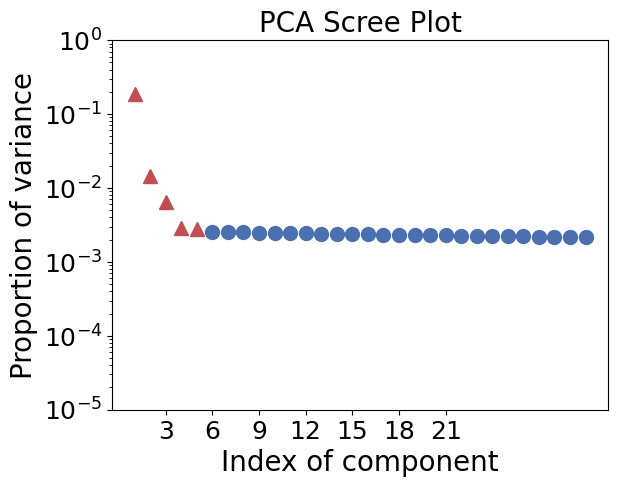

In [10]:
SI_anomalous = hs.signals.Signal1D(anomalous_image)

#PCA AND PLOTTING
fig=plt.figure(figsize=(5,5))
SI_anomalous.decomposition(algorithm="sklearn_pca")

# THRESHOLD IS THE NUMBER OF COMPONENETS
ax = SI_anomalous.plot_explained_variance_ratio(n=30,threshold=5,xaxis_type='number')
ax.set_title("PCA Scree Plot",fontsize=20)
ax.set_xlabel('Index of component',fontsize=20)
ax.set_ylabel('Proportion of variance',fontsize=20)
ax.set_xticks([3,6,9,12,15,18,21])
ax.set_xticklabels([3,6,9,12,15,18,21],fontsize=18)
ax.set_yticks([1,0.1,0.01,0.001,0.0001,0.00001])
ax.set_yticklabels(['10$^0$','10$^{-1}$','10$^{-2}$','10$^{-3}$','10$^{-4}$','10$^{-5}$'],fontsize=18)

#CHOOSE THE NUMBER OF COMPONENTS TO CONSTRUCT YOUR DATA
SI_pca_anom = SI_anomalous.get_decomposition_model(5);


Analyzing reconstruction with 3 components:

Plotting spectra for pixels with anomalies:


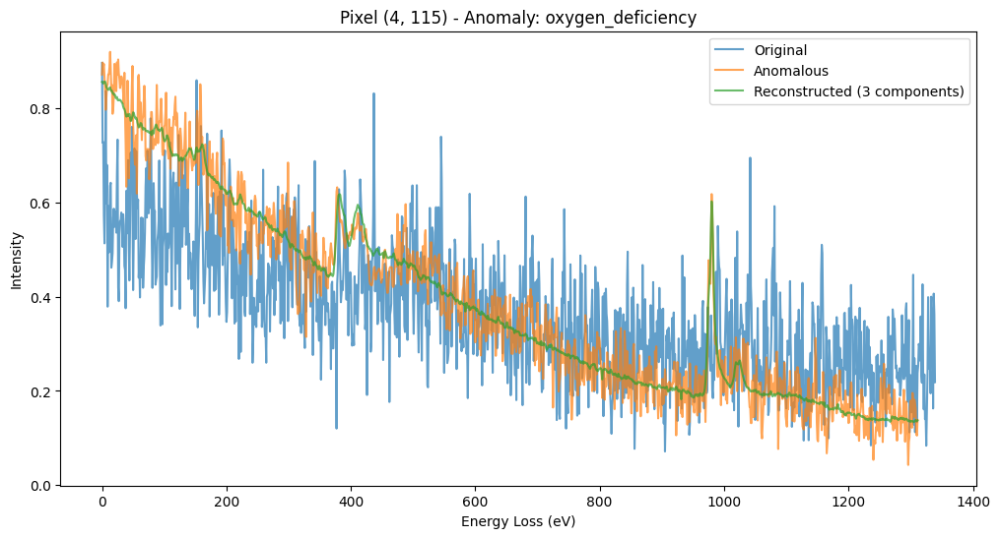

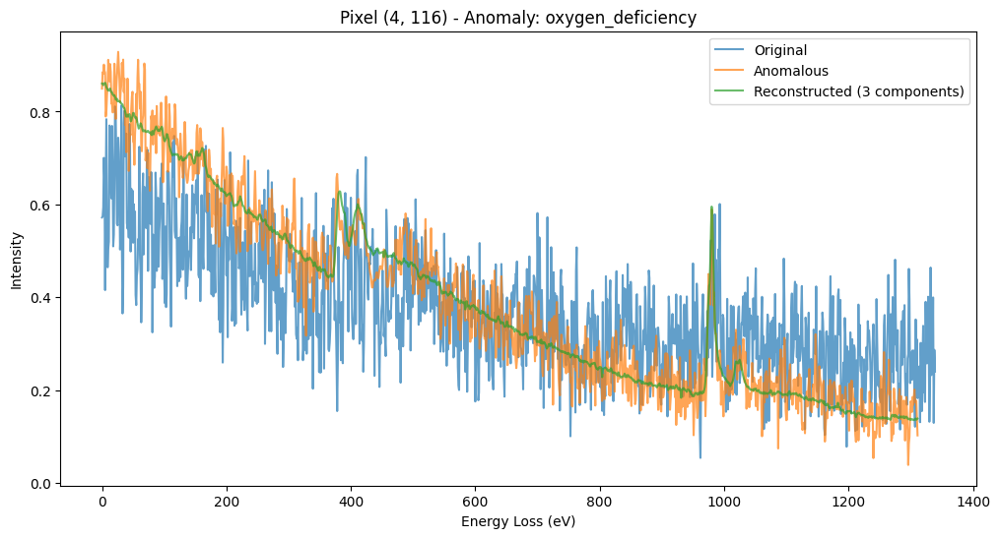

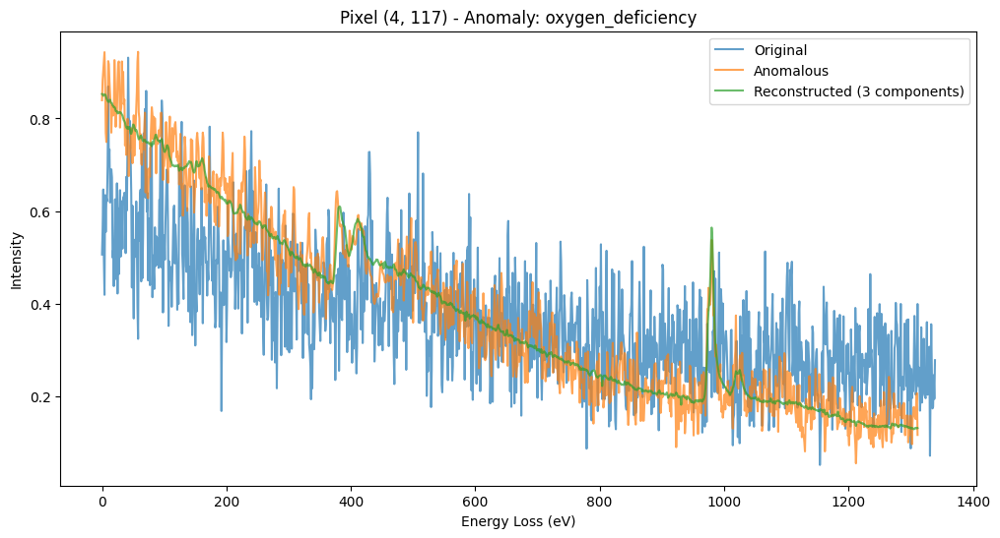

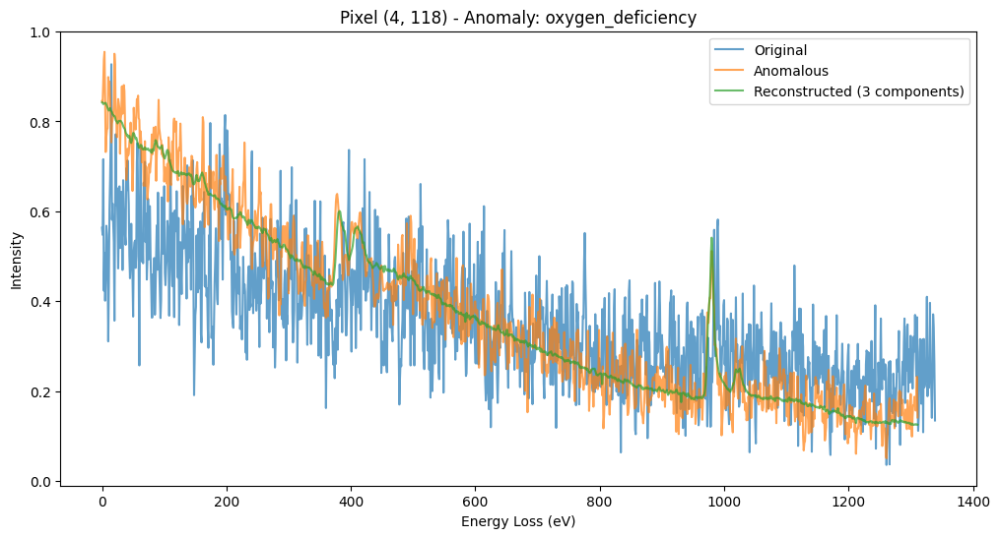

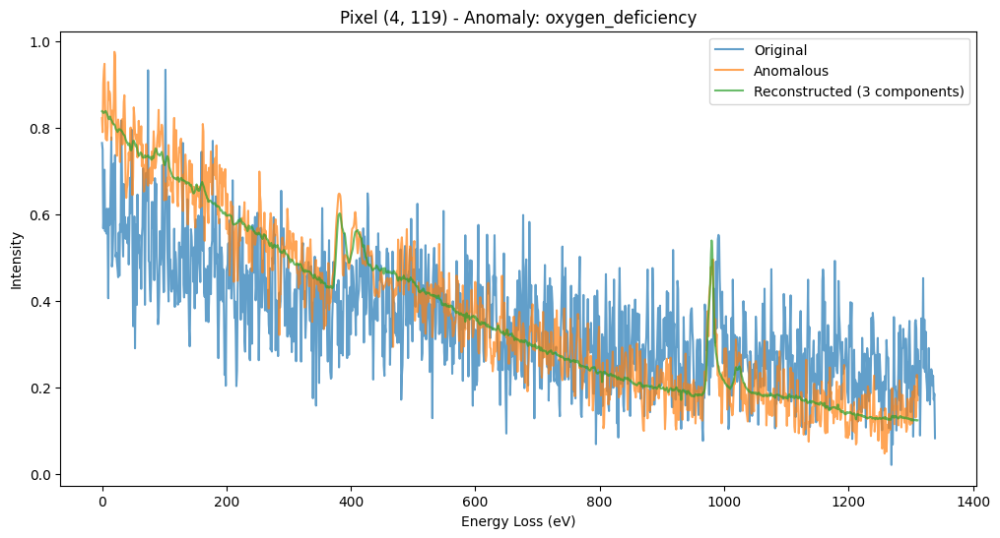

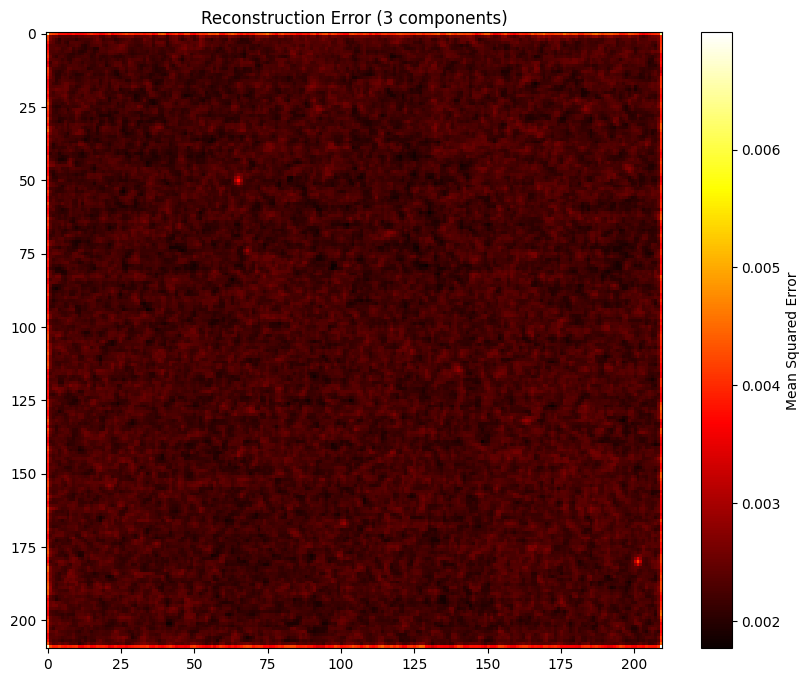

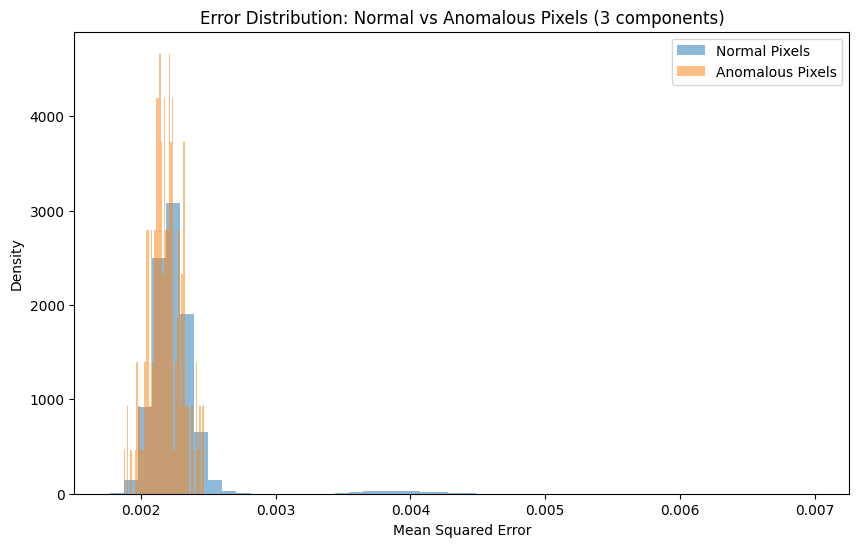

Mean error for normal pixels: 0.002261
Mean error for anomalous pixels: 0.002182
Ratio of mean errors (anomalous / normal): 0.96

Analyzing reconstruction with 4 components:

Plotting spectra for pixels with anomalies:


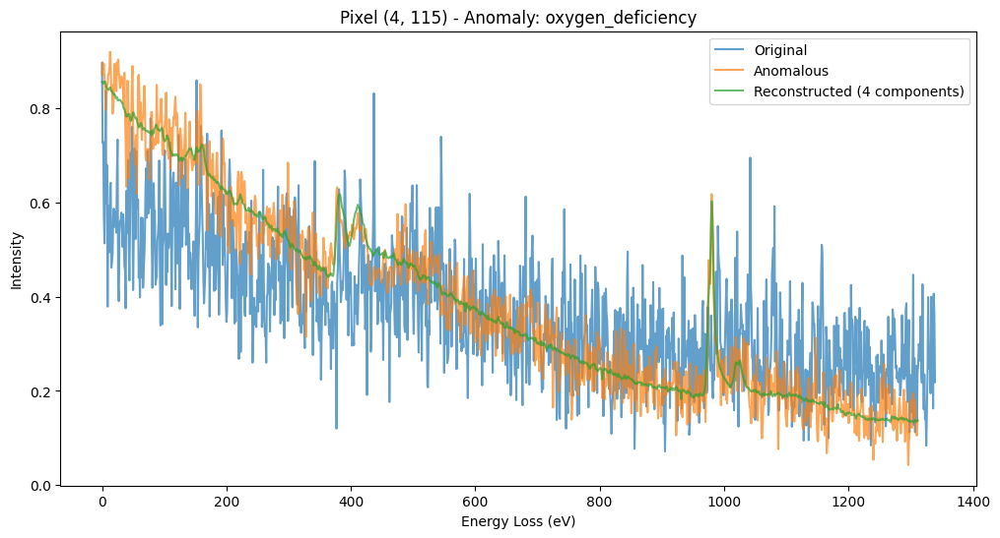

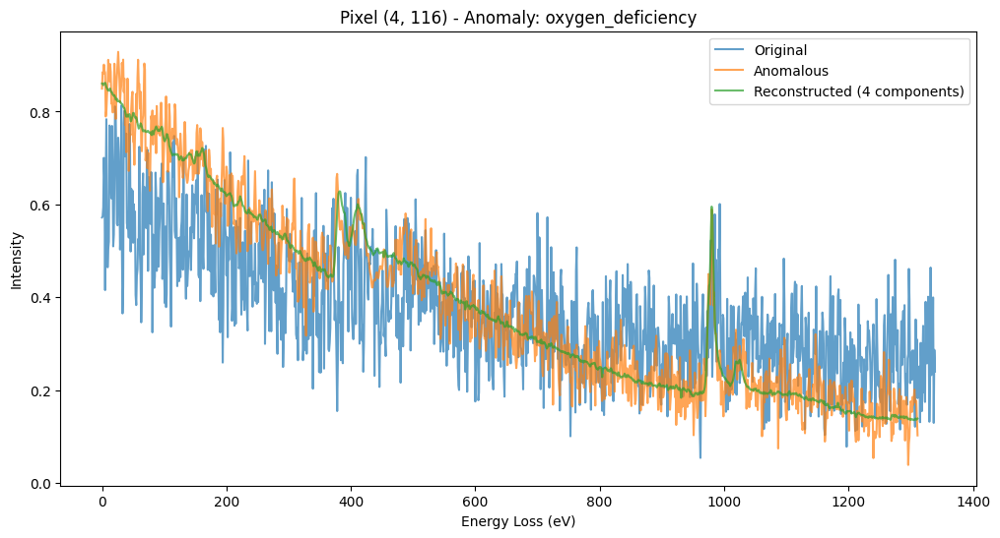

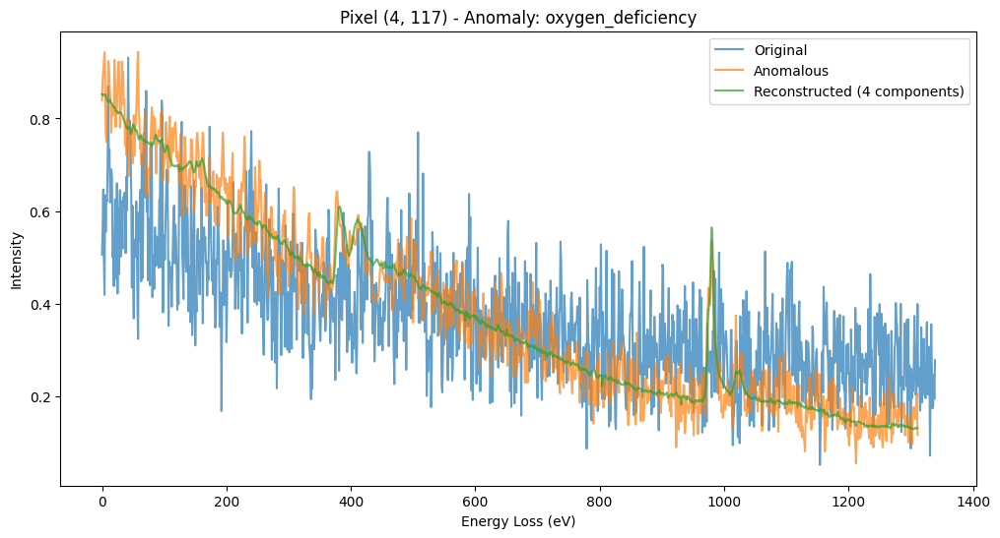

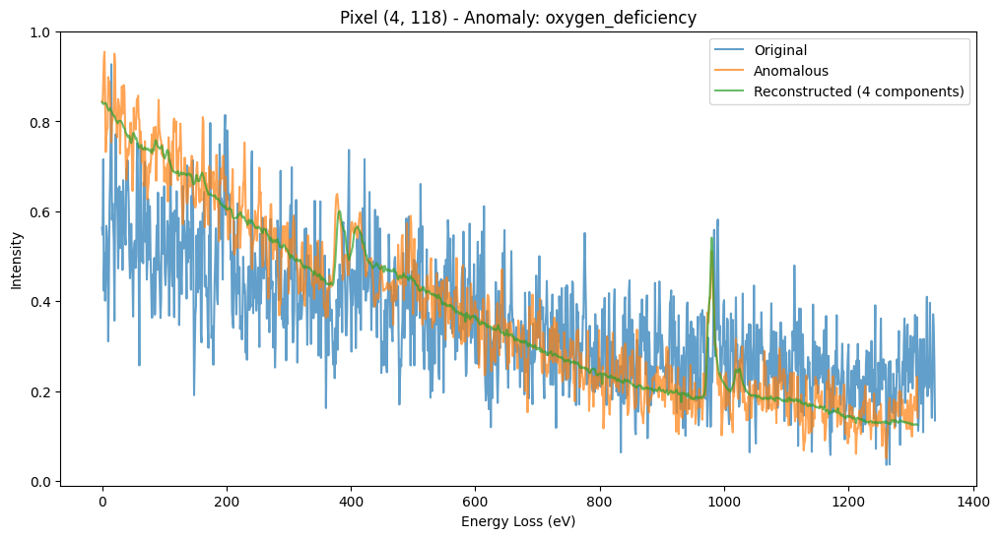

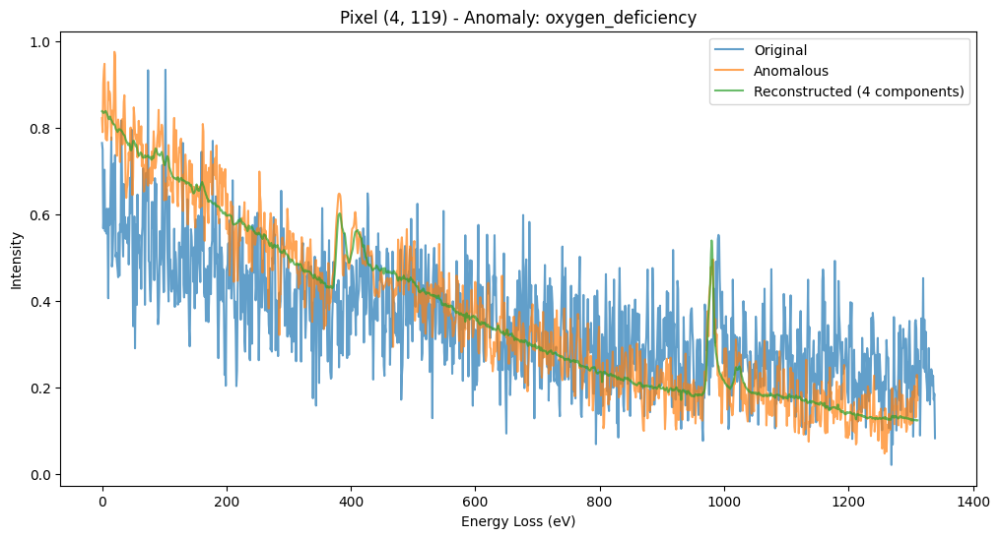

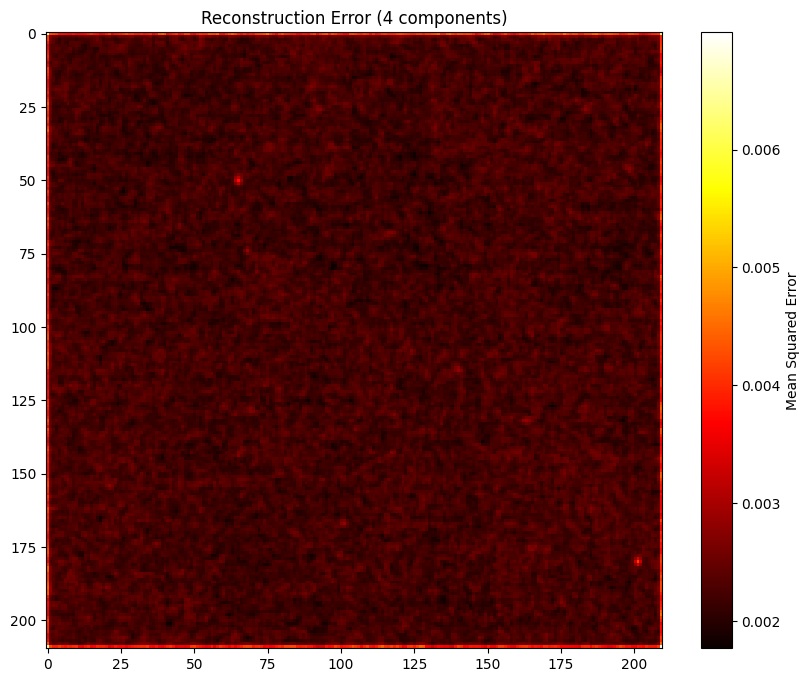

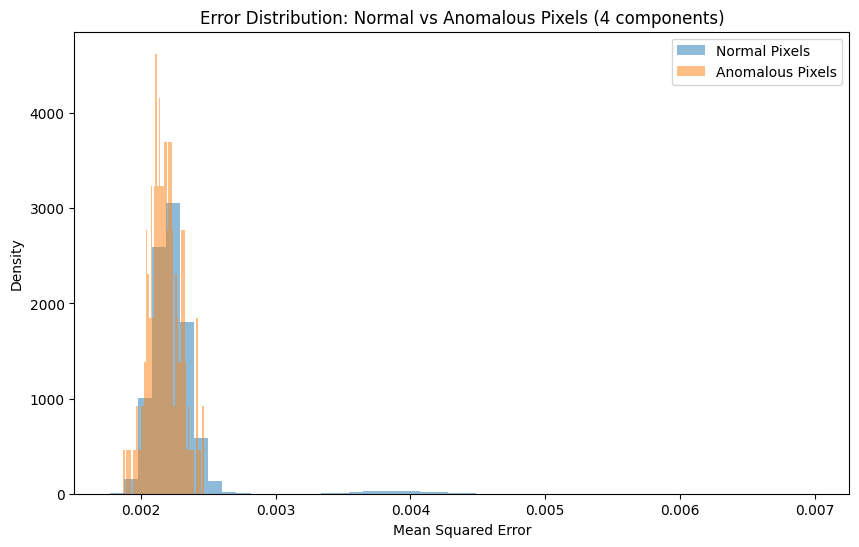

Mean error for normal pixels: 0.002253
Mean error for anomalous pixels: 0.002175
Ratio of mean errors (anomalous / normal): 0.97

Analyzing reconstruction with 5 components:

Plotting spectra for pixels with anomalies:


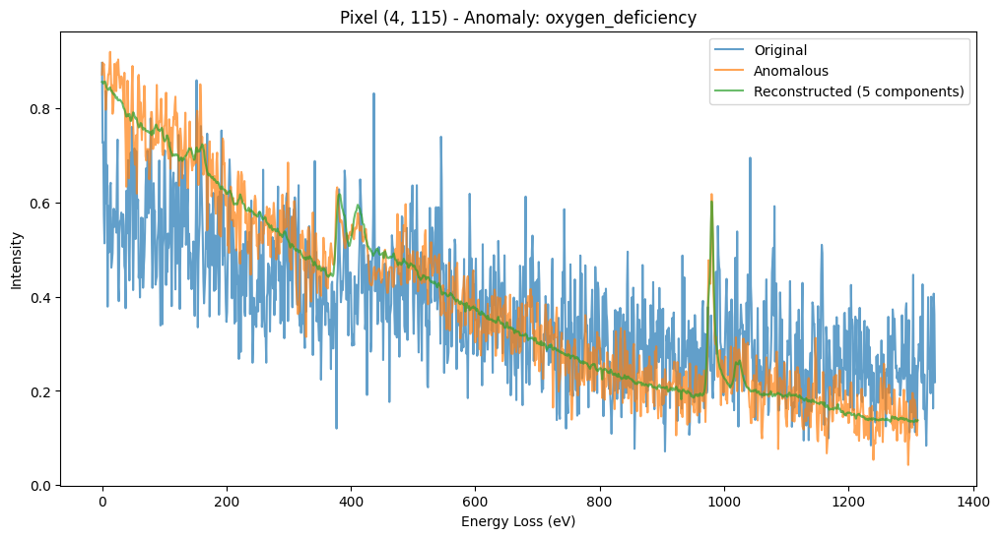

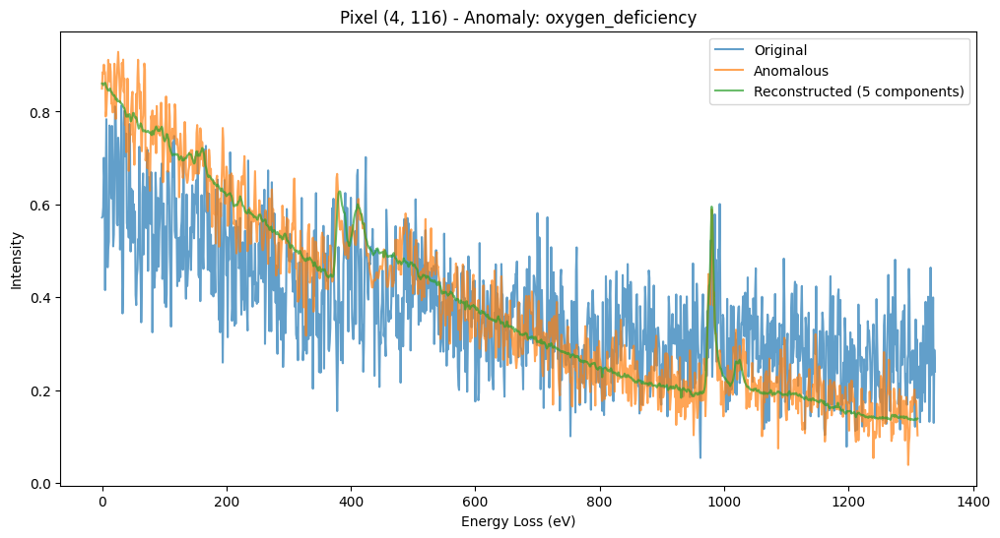

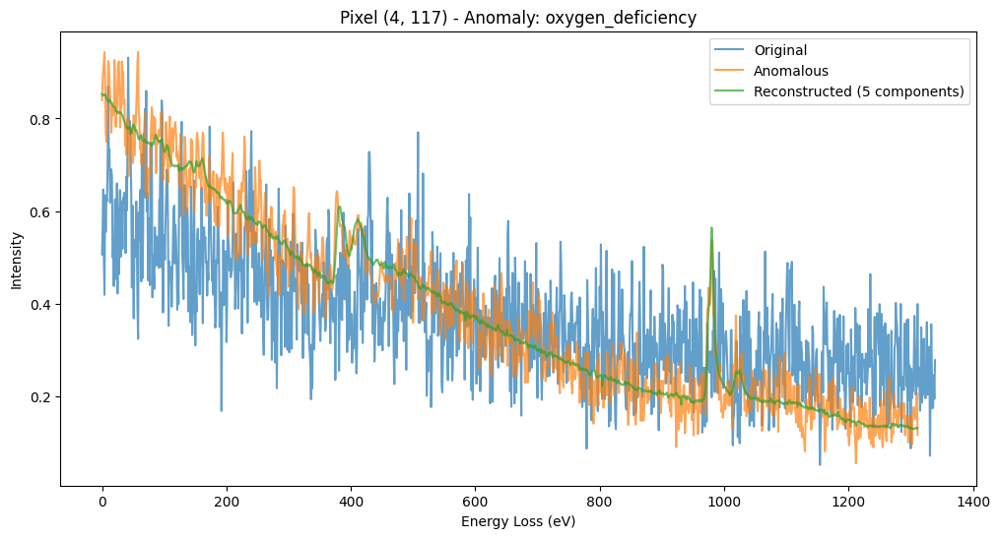

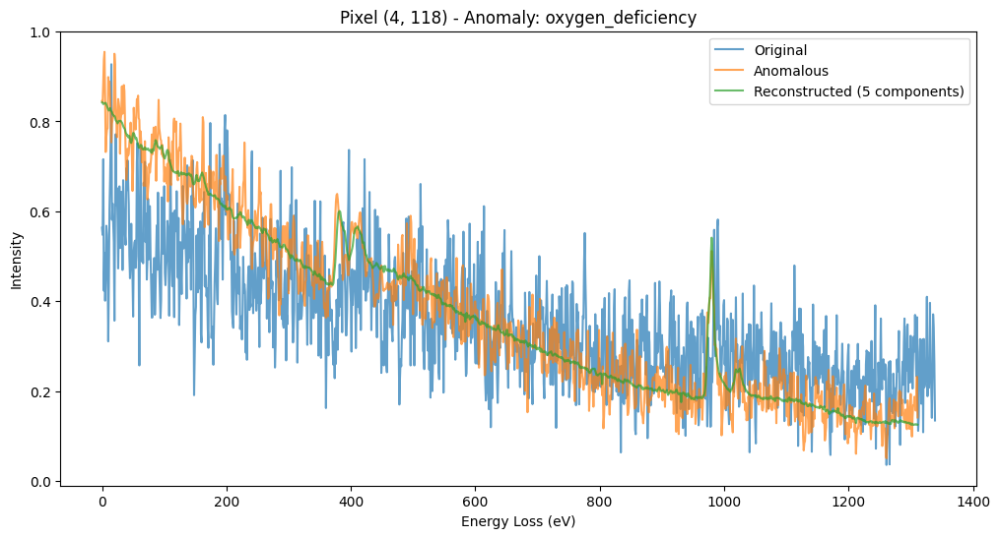

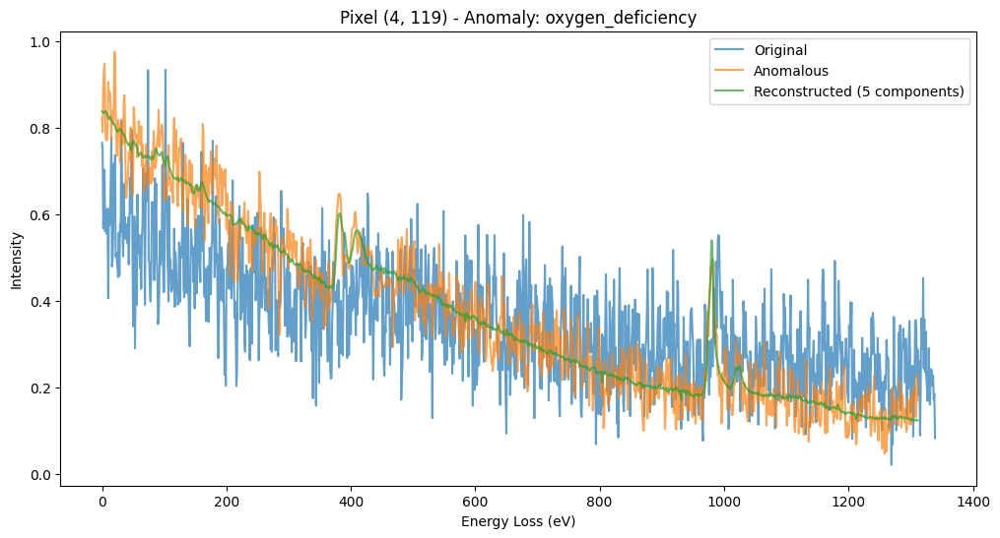

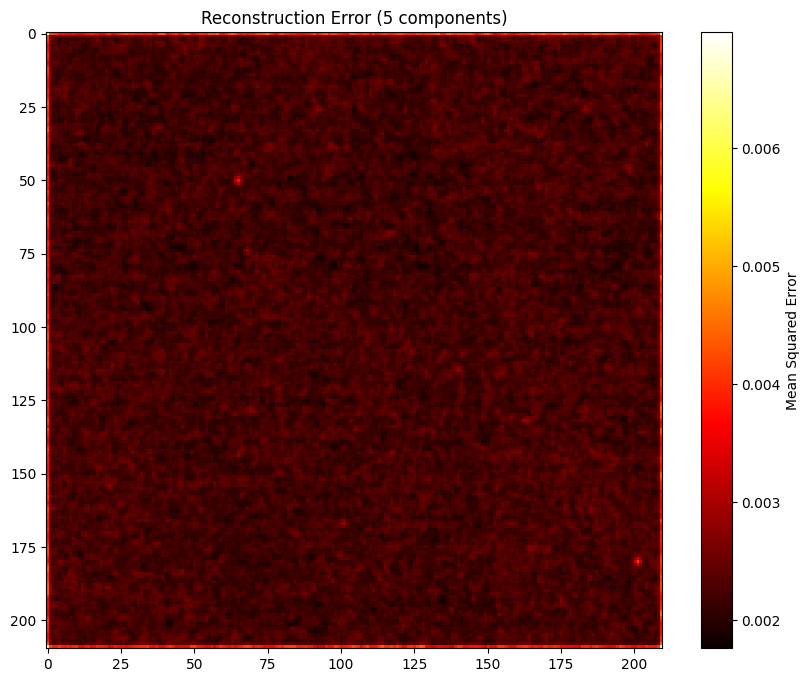

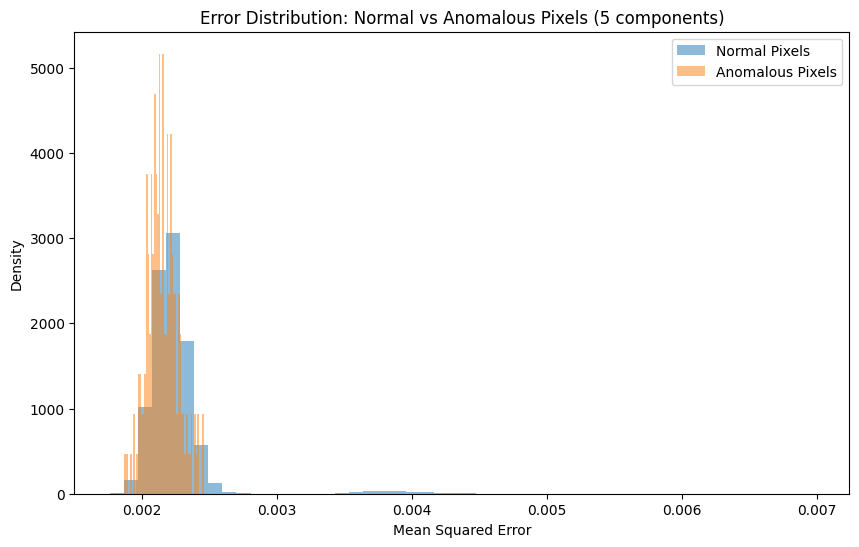

Mean error for normal pixels: 0.002245
Mean error for anomalous pixels: 0.002153
Ratio of mean errors (anomalous / normal): 0.96


In [11]:
# Get indices of pixels with anomalies
anomaly_coords = np.argwhere(anomaly_mask > 0)

# Function to plot comparison of spectra
def plot_spectra_comparison(original_signal, anomalous_signal, reconstructed_signal, coord, n_components):
    y, x = coord
    anomaly_type = list(anomaly_types.keys())[list(anomaly_types.values()).index(anomaly_mask[y, x])]
    
    plt.figure(figsize=(12, 6))
    plt.plot(original_signal.inav[x, y].data, label='Original', alpha=0.7)
    plt.plot(anomalous_signal.inav[x, y].data, label='Anomalous', alpha=0.7)
    plt.plot(reconstructed_signal.inav[x, y].data, label=f'Reconstructed ({n_components} components)', alpha=0.7)
    plt.legend()
    plt.title(f'Pixel ({y}, {x}) - Anomaly: {anomaly_type}')
    plt.xlabel('Energy Loss (eV)')
    plt.ylabel('Intensity')
    plt.show()

# Try different numbers of components for reconstruction
n_components_list = [3, 4, 5]  # You can adjust these numbers

for n_components in n_components_list:
    print(f"\nAnalyzing reconstruction with {n_components} components:")
    
    # Reconstruct the data
    SI_reconstructed = SI_anomalous.get_decomposition_model(n_components)
    
    # Plot the first 5 anomalous pixels
    print(f"\nPlotting spectra for pixels with anomalies:")
    for i in range(min(5, len(anomaly_coords))):
        coord = anomaly_coords[i]
        plot_spectra_comparison(SI_raw, SI_anomalous, SI_pca_anom, coord, n_components)
    
    # Calculate reconstruction error
    error = np.mean((SI_anomalous.data - SI_reconstructed.data)**2, axis=2)
    
    # Plot error map
    plt.figure(figsize=(10, 8))
    plt.imshow(error, cmap='hot', interpolation='nearest')
    plt.colorbar(label='Mean Squared Error')
    plt.title(f'Reconstruction Error ({n_components} components)')
    plt.show()
    
    # Compare error distributions
    normal_error = error[anomaly_mask == 0].flatten()
    anomaly_error = error[anomaly_mask > 0].flatten()
    
    plt.figure(figsize=(10, 6))
    plt.hist(normal_error, bins=50, alpha=0.5, label='Normal Pixels', density=True)
    plt.hist(anomaly_error, bins=50, alpha=0.5, label='Anomalous Pixels', density=True)
    plt.xlabel('Mean Squared Error')
    plt.ylabel('Density')
    plt.title(f'Error Distribution: Normal vs Anomalous Pixels ({n_components} components)')
    plt.legend()
    plt.show()
    
    # Print summary statistics
    print(f"Mean error for normal pixels: {np.mean(normal_error):.6f}")
    print(f"Mean error for anomalous pixels: {np.mean(anomaly_error):.6f}")
    print(f"Ratio of mean errors (anomalous / normal): {np.mean(anomaly_error) / np.mean(normal_error):.2f}")


Analyzing reconstruction with 3 components:

Plotting spectra for pixels with anomalies:


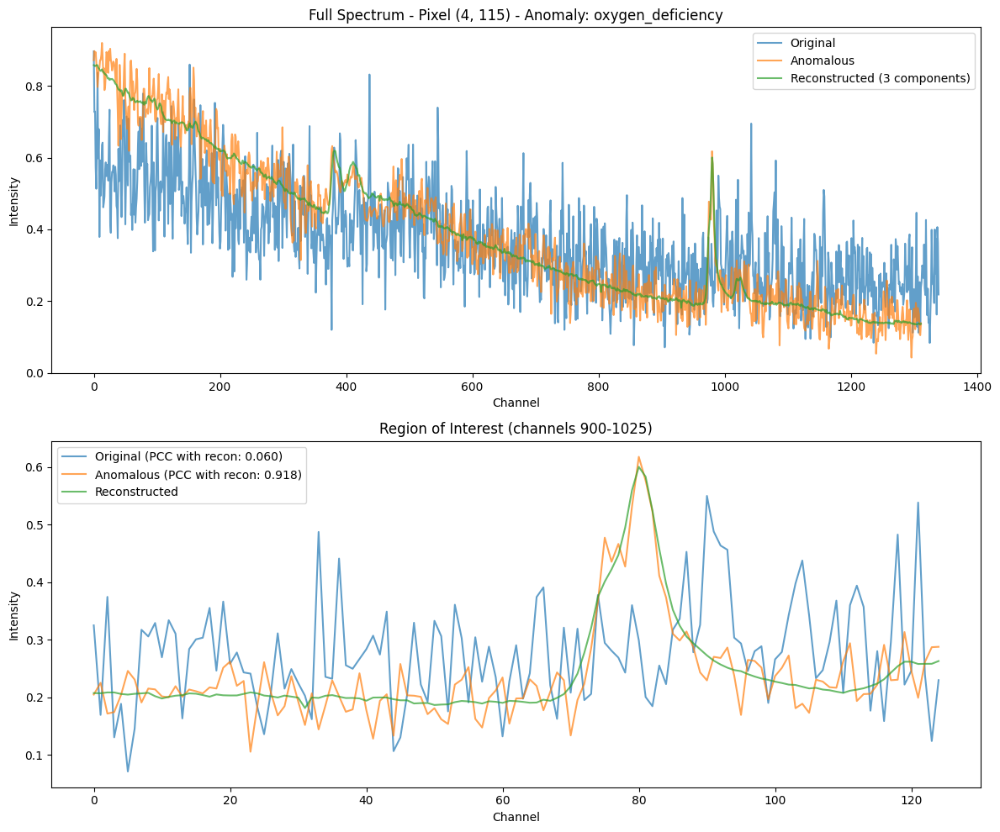

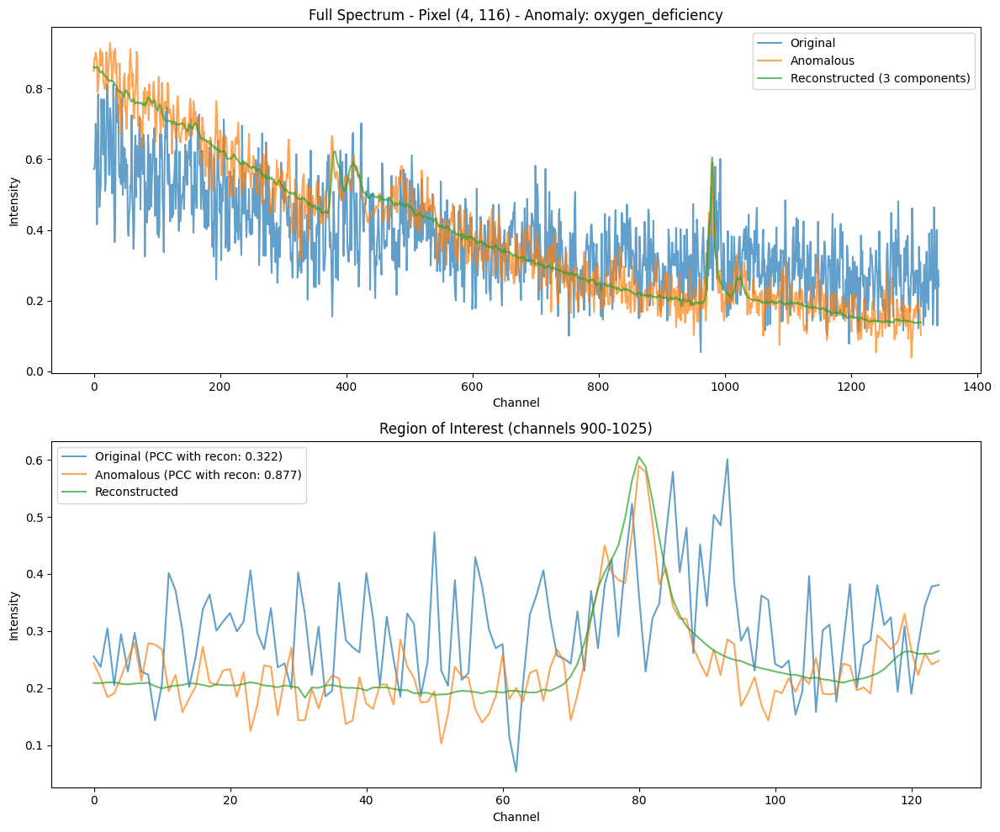

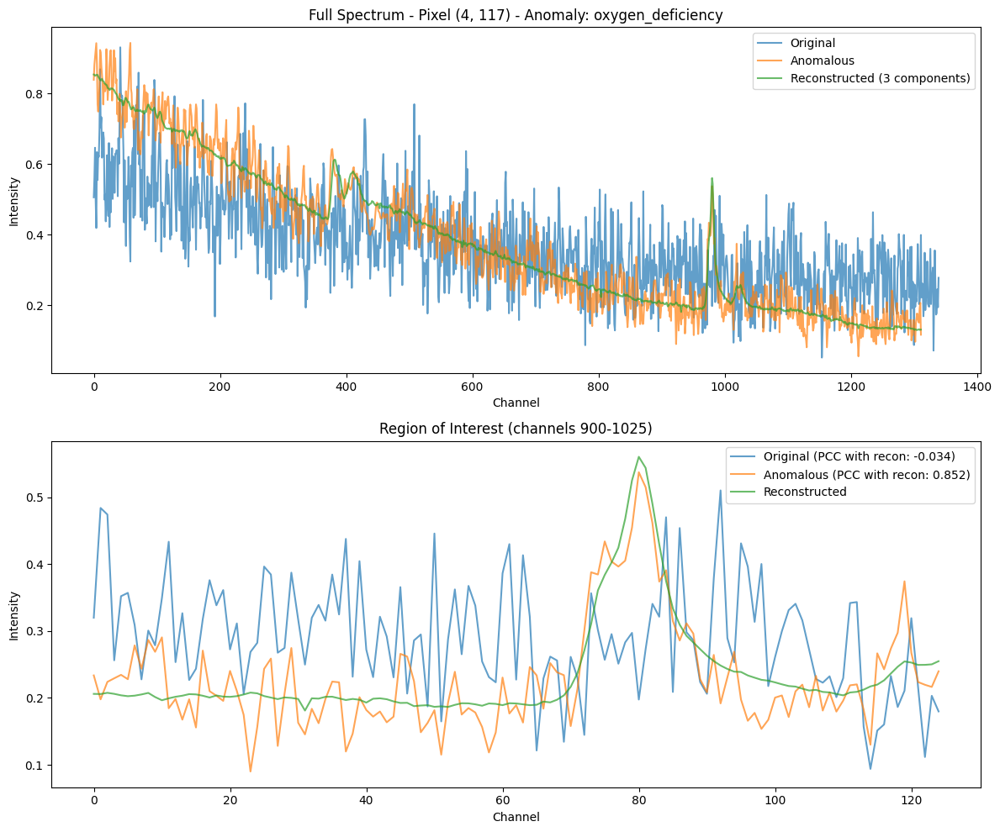

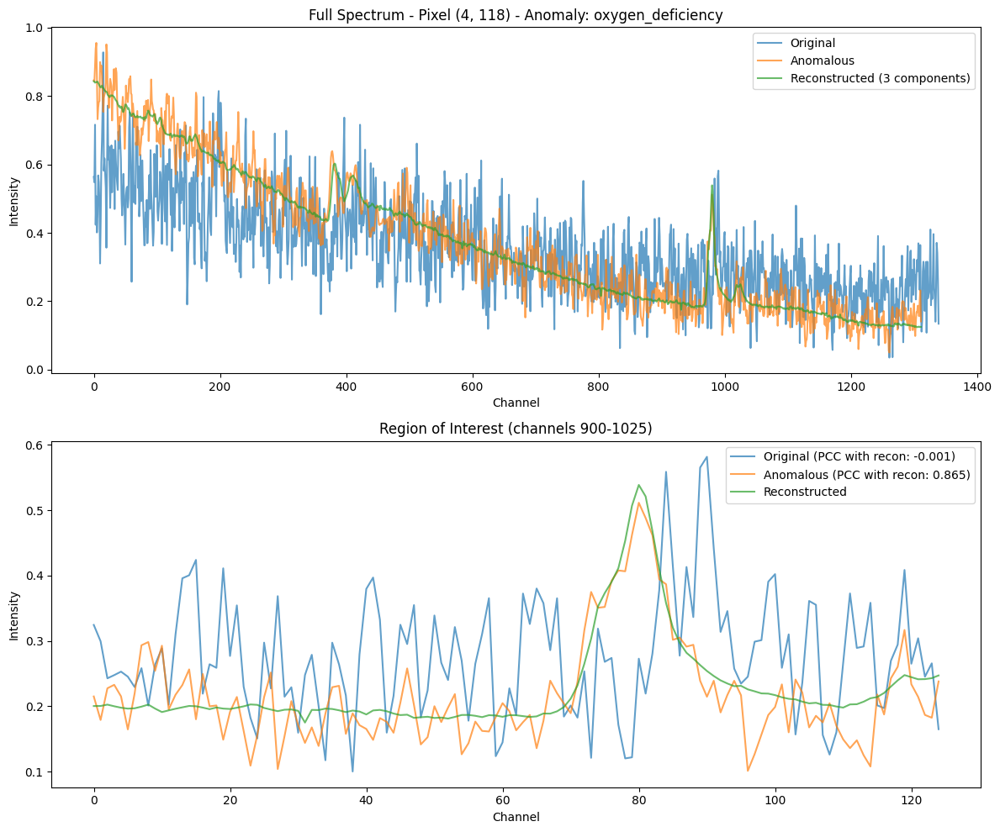

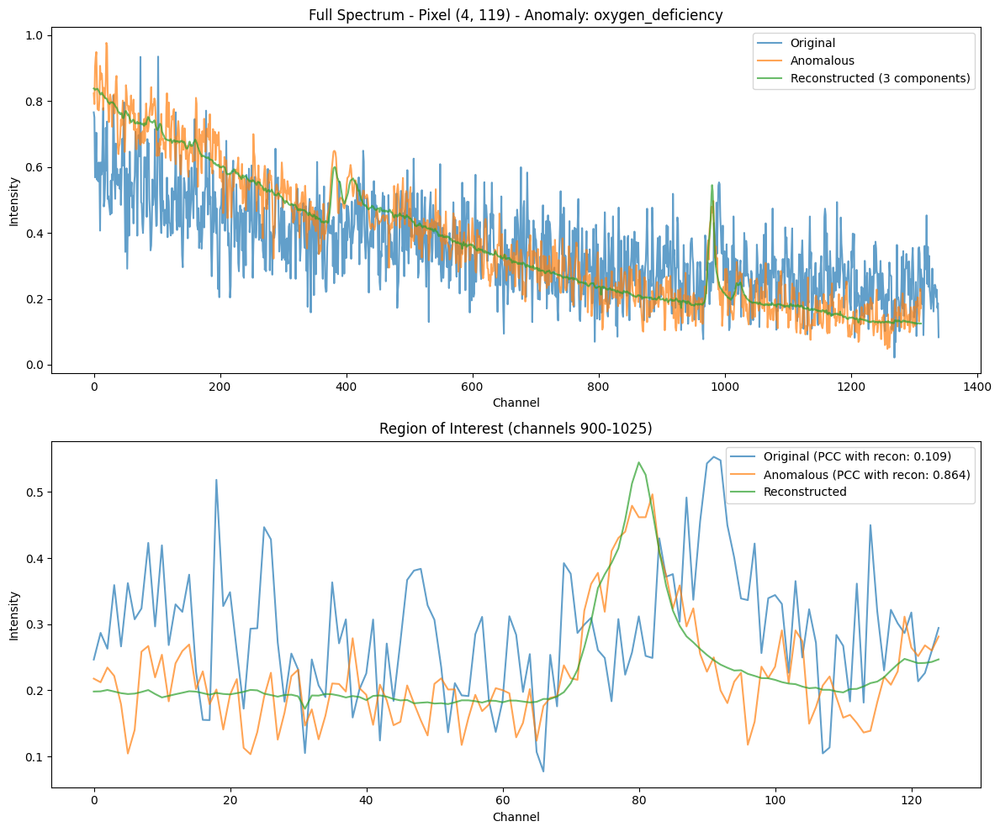

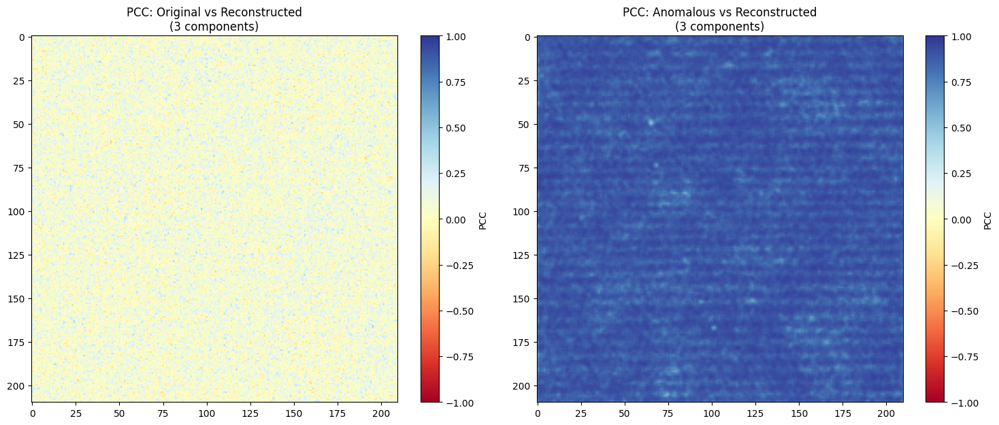

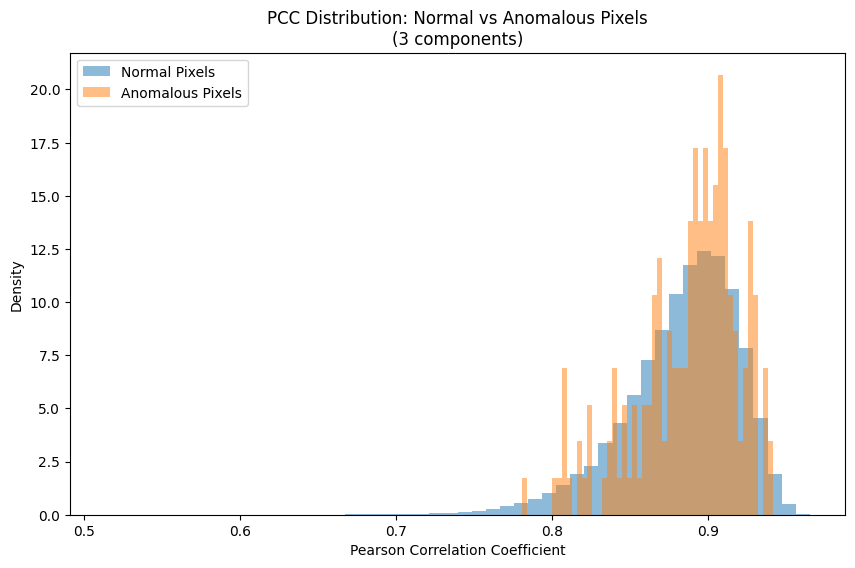


PCC Statistics:
Mean PCC for normal pixels: 0.883
Mean PCC for anomalous pixels: 0.888

Analyzing reconstruction with 4 components:

Plotting spectra for pixels with anomalies:


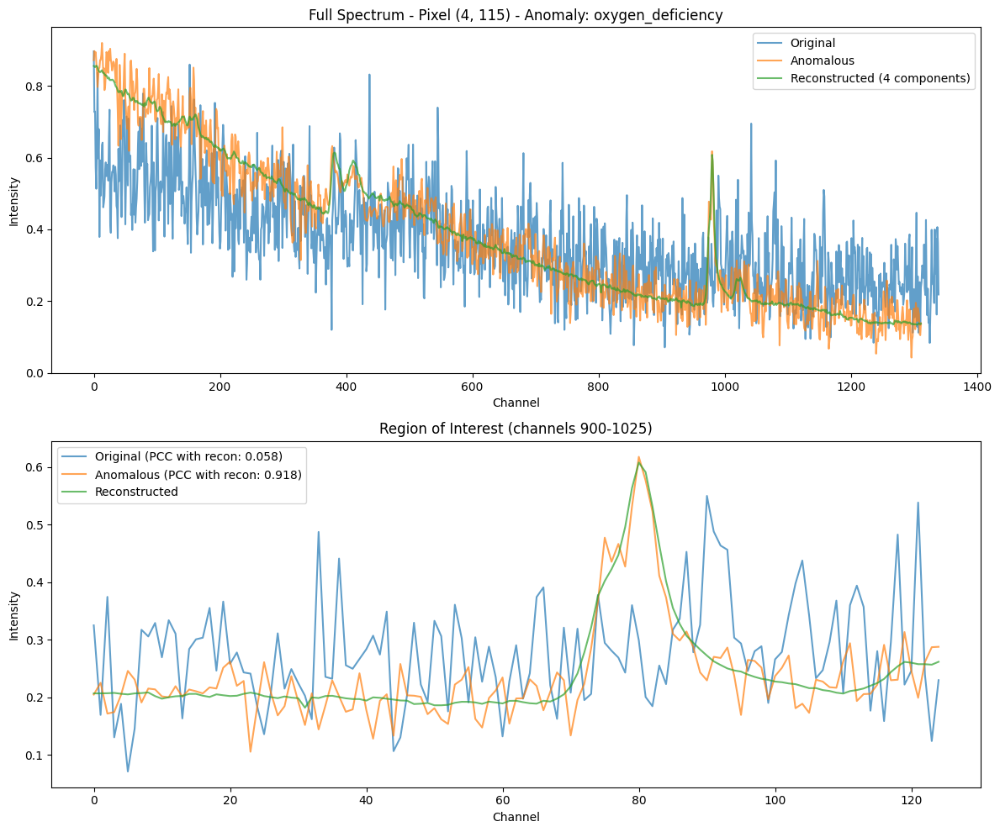

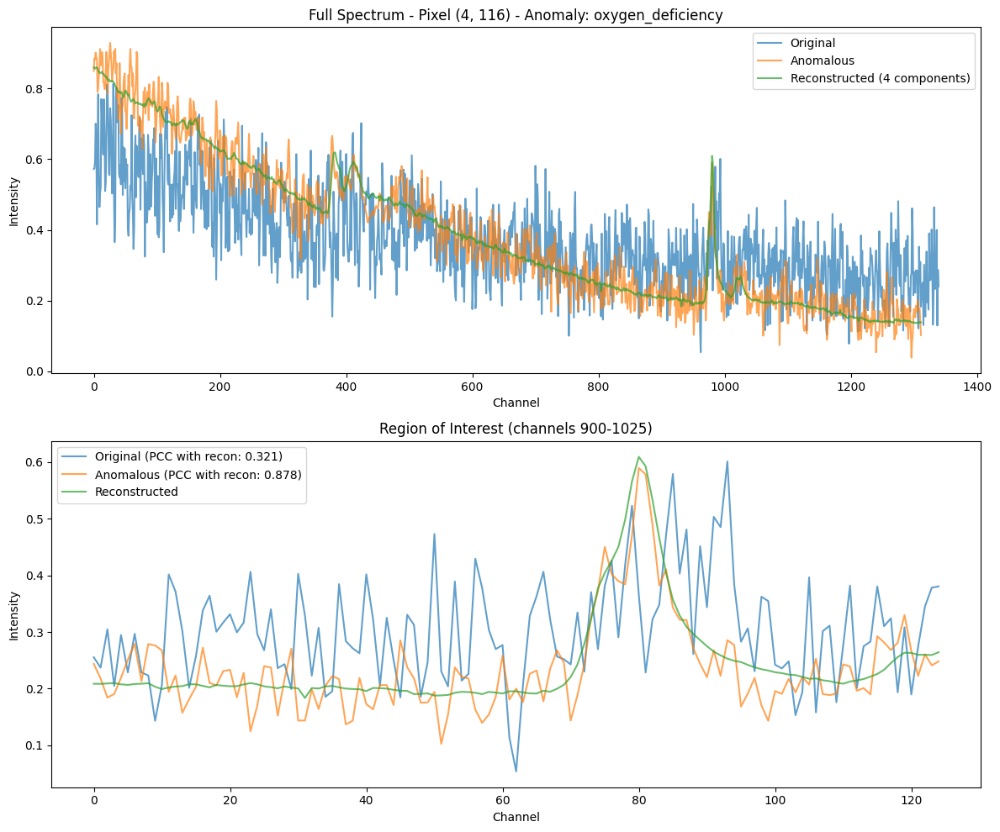

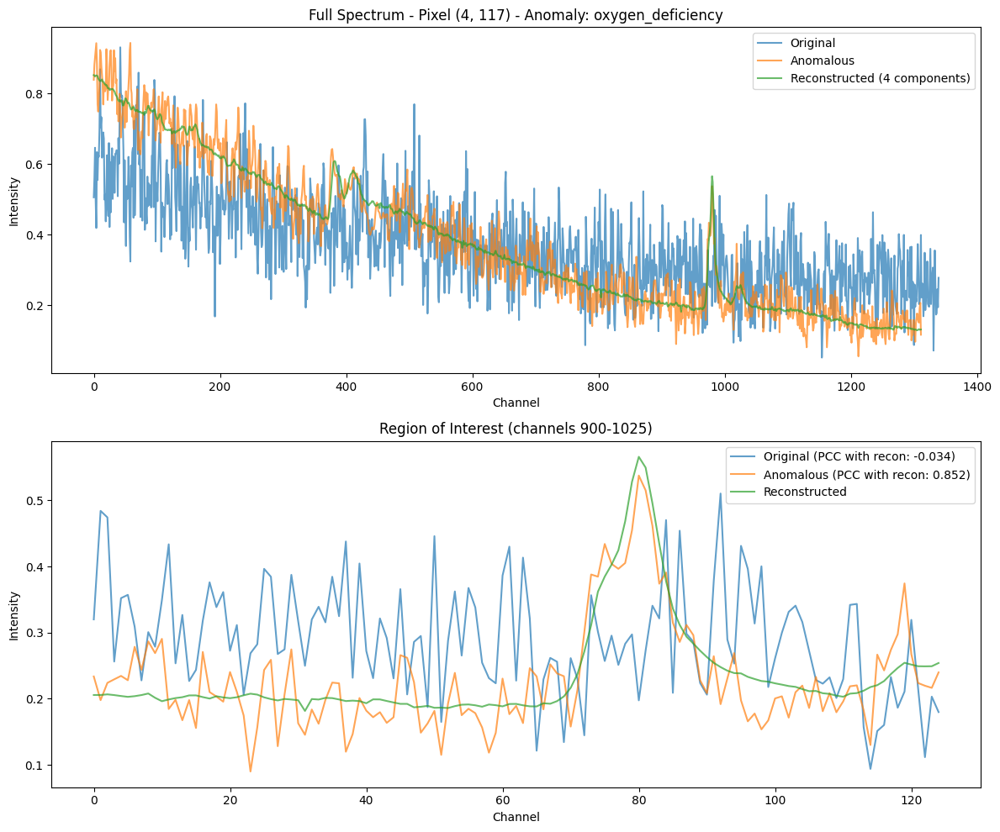

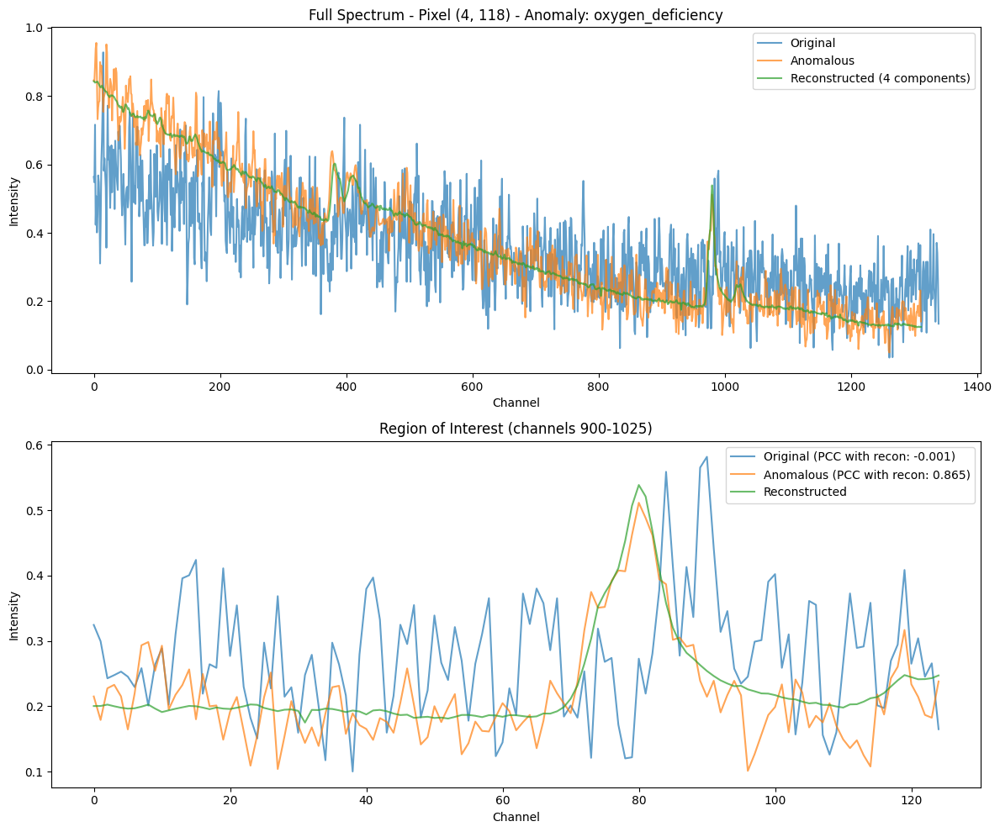

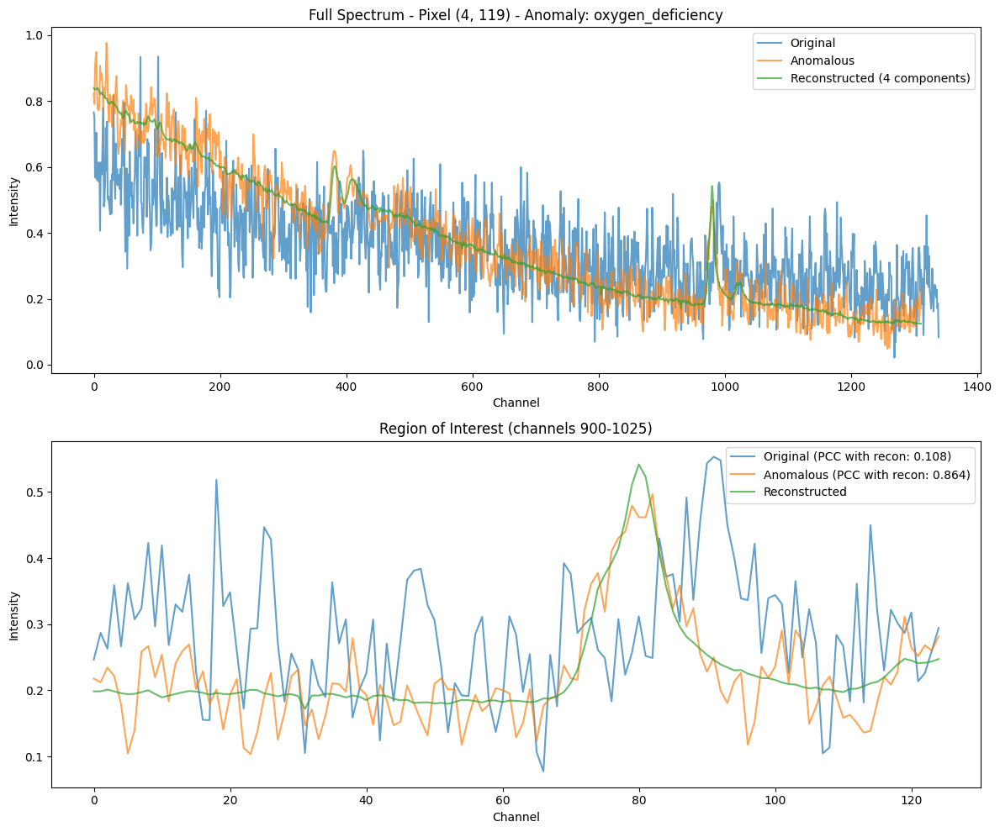

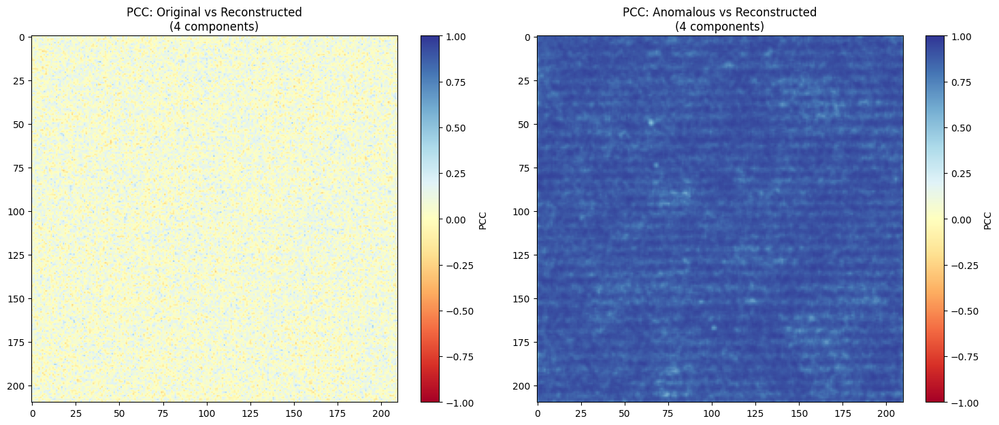

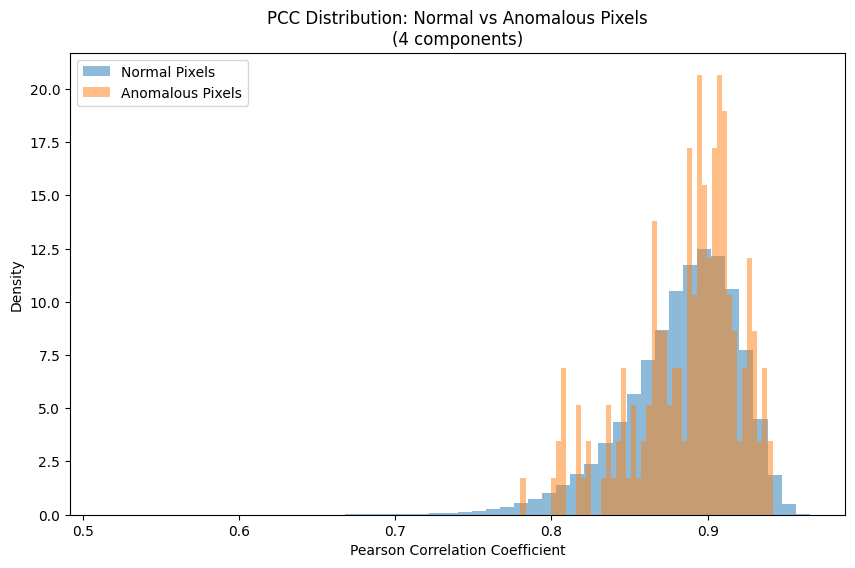


PCC Statistics:
Mean PCC for normal pixels: 0.883
Mean PCC for anomalous pixels: 0.888

Analyzing reconstruction with 5 components:

Plotting spectra for pixels with anomalies:


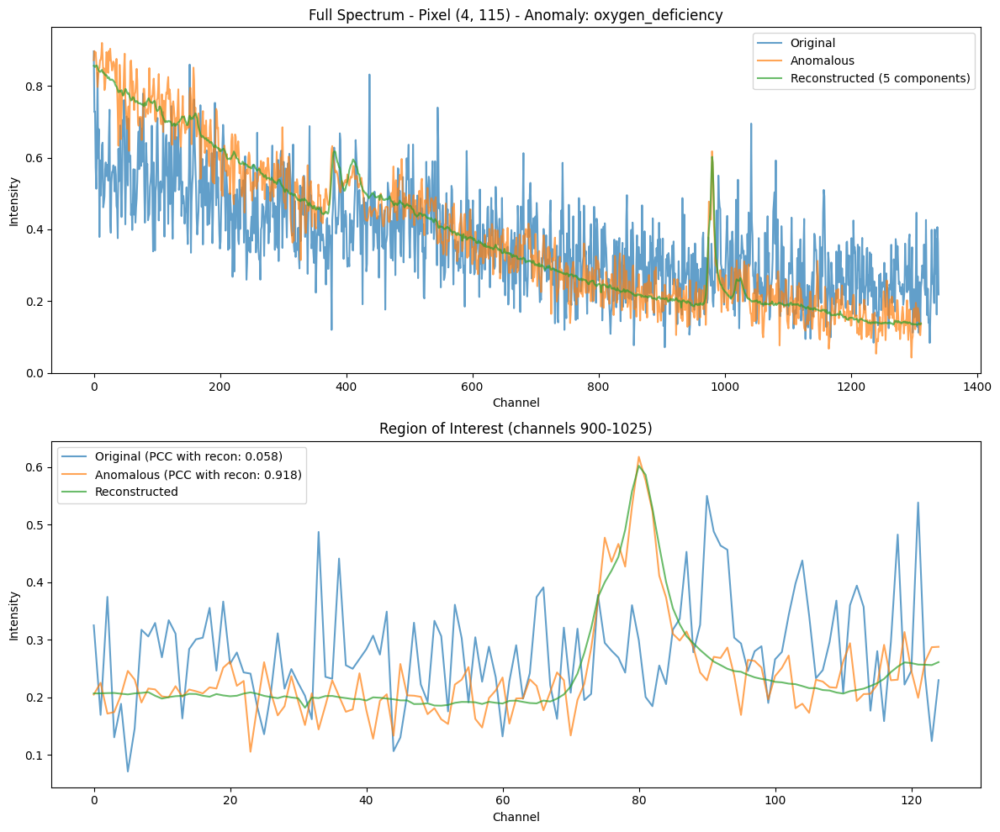

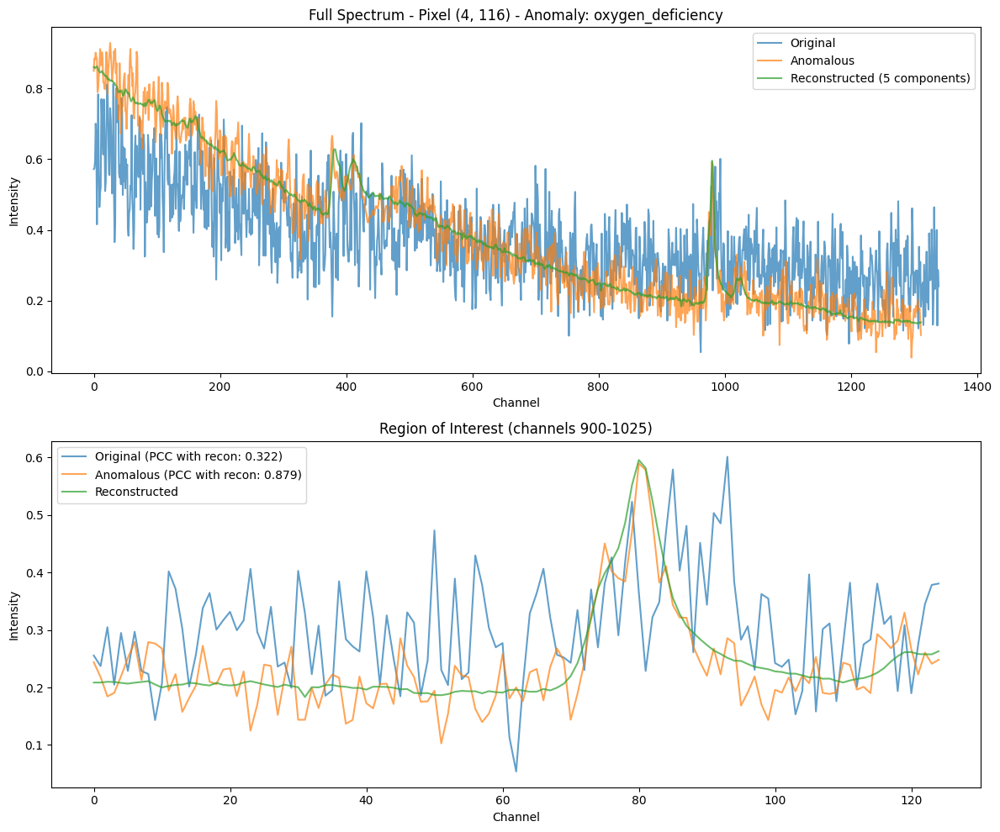

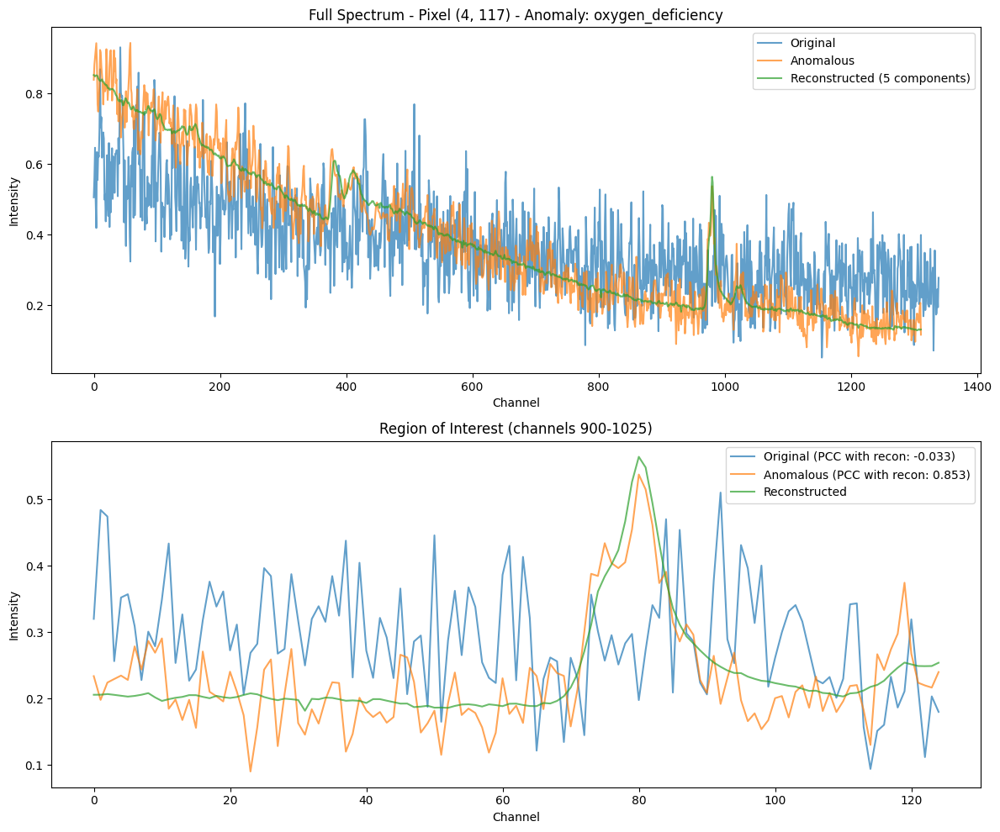

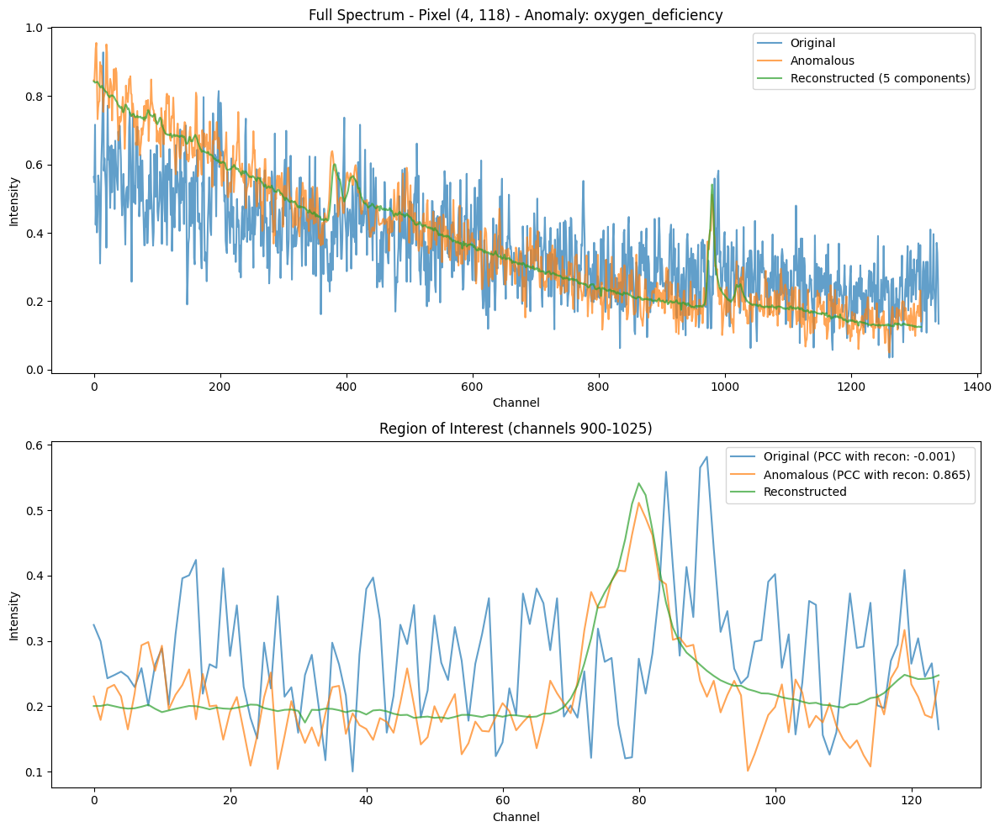

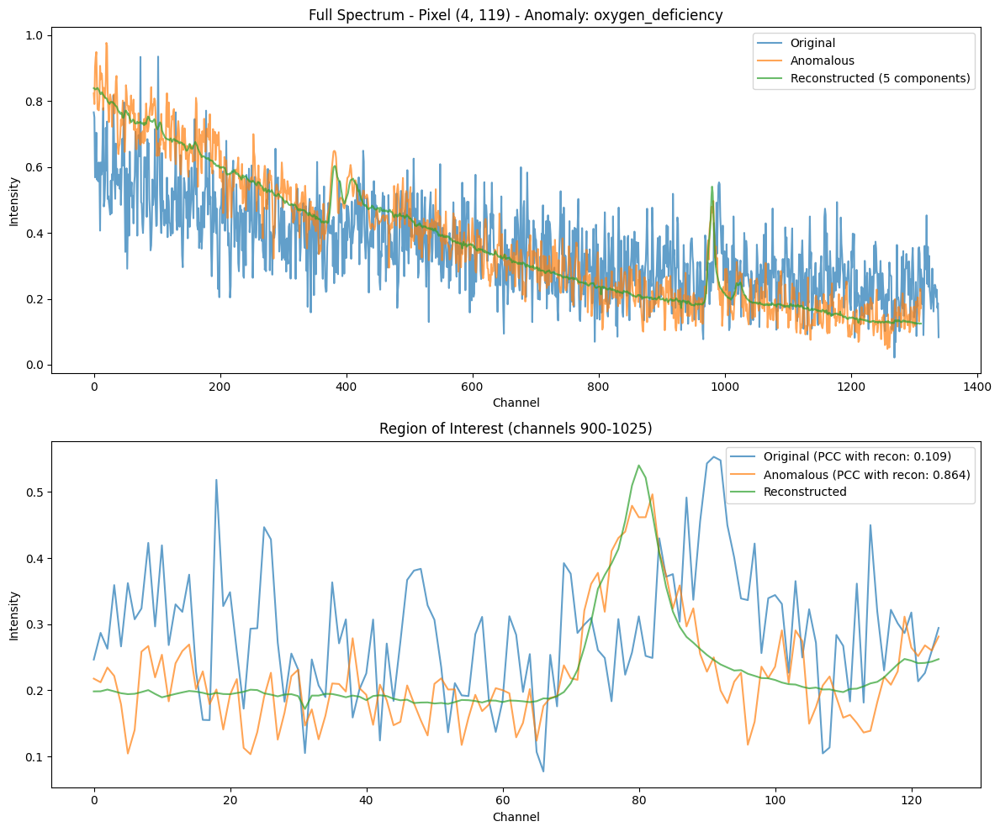

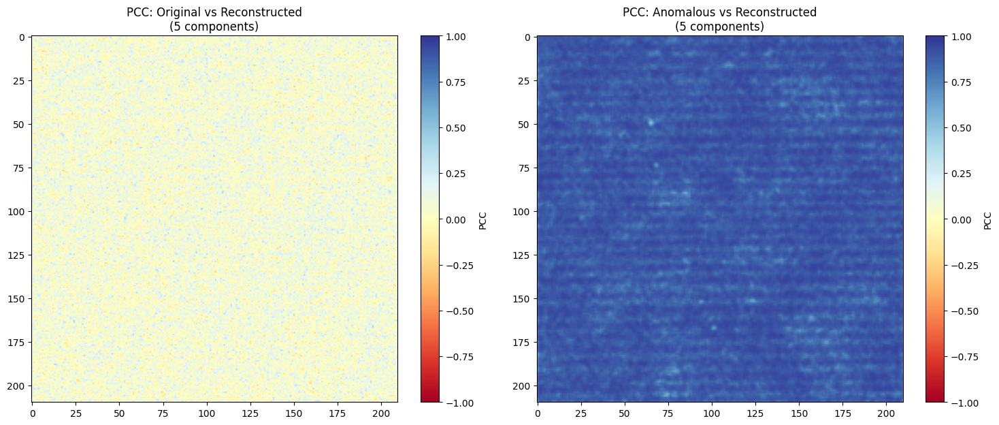

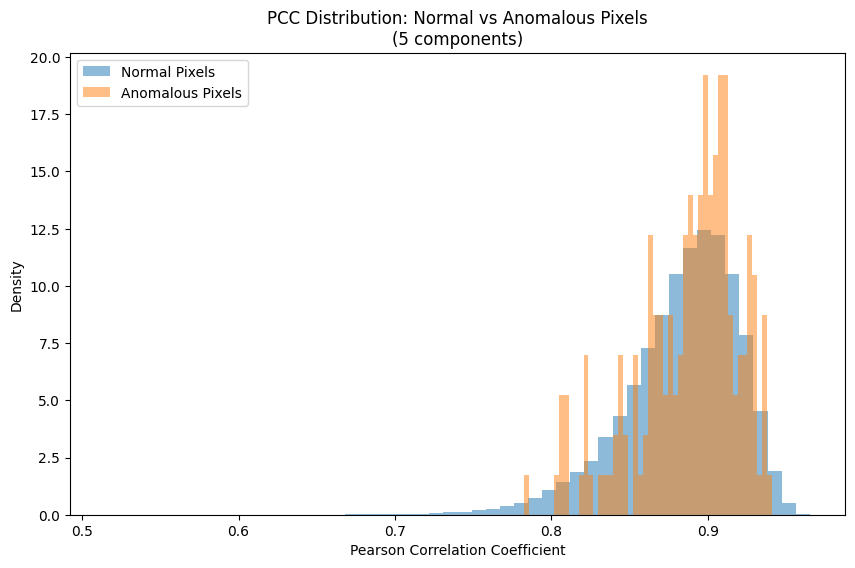


PCC Statistics:
Mean PCC for normal pixels: 0.883
Mean PCC for anomalous pixels: 0.888


In [12]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import pearsonr

def calculate_pcc(spec1, spec2, range_start=900, range_end=1025):
    """Calculate Pearson Correlation Coefficient for spectra within specified range"""
    spec1_range = spec1[range_start:range_end]
    spec2_range = spec2[range_start:range_end]
    pcc, _ = pearsonr(spec1_range, spec2_range)
    return pcc

def calculate_pcc_map(data1, data2, range_start=900, range_end=1025):
    """Calculate PCC map for two datasets"""
    shape = data1.shape[:-1]
    pcc_map = np.zeros(shape)
    
    for i in range(shape[0]):
        for j in range(shape[1]):
            pcc_map[i,j] = calculate_pcc(data1[i,j], data2[i,j], range_start, range_end)
    
    return pcc_map

def plot_spectra_comparison(original_signal, anomalous_signal, reconstructed_signal, coord, n_components, range_start=900, range_end=1025):
    y, x = coord
    anomaly_type = list(anomaly_types.keys())[list(anomaly_types.values()).index(anomaly_mask[y, x])]
    
    # Get spectra
    orig_spec = original_signal.inav[x, y].data
    anom_spec = anomalous_signal.inav[x, y].data
    recon_spec = reconstructed_signal.inav[x, y].data
    
    # Calculate PCCs
    pcc_orig_recon = calculate_pcc(orig_spec, recon_spec, range_start, range_end)
    pcc_anom_recon = calculate_pcc(anom_spec, recon_spec, range_start, range_end)
    
    # Plot
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10))
    
    # Full spectrum
    ax1.plot(orig_spec, label='Original', alpha=0.7)
    ax1.plot(anom_spec, label='Anomalous', alpha=0.7)
    ax1.plot(recon_spec, label=f'Reconstructed ({n_components} components)', alpha=0.7)
    ax1.legend()
    ax1.set_title(f'Full Spectrum - Pixel ({y}, {x}) - Anomaly: {anomaly_type}')
    ax1.set_xlabel('Channel')
    ax1.set_ylabel('Intensity')
    
    # Region of interest
    ax2.plot(orig_spec[range_start:range_end], label=f'Original (PCC with recon: {pcc_orig_recon:.3f})', alpha=0.7)
    ax2.plot(anom_spec[range_start:range_end], label=f'Anomalous (PCC with recon: {pcc_anom_recon:.3f})', alpha=0.7)
    ax2.plot(recon_spec[range_start:range_end], label='Reconstructed', alpha=0.7)
    ax2.legend()
    ax2.set_title(f'Region of Interest (channels {range_start}-{range_end})')
    ax2.set_xlabel('Channel')
    ax2.set_ylabel('Intensity')
    
    plt.tight_layout()
    plt.show()

# Analysis for different numbers of components
n_components_list = [3, 4, 5]
range_start, range_end = 900, 1025

for n_components in n_components_list:
    print(f"\nAnalyzing reconstruction with {n_components} components:")
    
    # Reconstruct the data
    SI_reconstructed = SI_anomalous.get_decomposition_model(n_components)
    
    # Calculate PCC maps
    pcc_map_orig = calculate_pcc_map(SI_raw.data, SI_reconstructed.data, range_start, range_end)
    pcc_map_anom = calculate_pcc_map(SI_anomalous.data, SI_reconstructed.data, range_start, range_end)
    
    # Plot example spectra
    print(f"\nPlotting spectra for pixels with anomalies:")
    for i in range(min(5, len(anomaly_coords))):
        coord = anomaly_coords[i]
        plot_spectra_comparison(SI_raw, SI_anomalous, SI_reconstructed, coord, n_components, range_start, range_end)
    
    # Plot PCC maps
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    
    im1 = ax1.imshow(pcc_map_orig, cmap='RdYlBu', vmin=-1, vmax=1)
    plt.colorbar(im1, ax=ax1, label='PCC')
    ax1.set_title(f'PCC: Original vs Reconstructed\n({n_components} components)')
    
    im2 = ax2.imshow(pcc_map_anom, cmap='RdYlBu', vmin=-1, vmax=1)
    plt.colorbar(im2, ax=ax2, label='PCC')
    ax2.set_title(f'PCC: Anomalous vs Reconstructed\n({n_components} components)')
    
    plt.tight_layout()
    plt.show()
    
    # Create PCC histograms
    plt.figure(figsize=(10, 6))
    
    # Normal pixels
    plt.hist(pcc_map_anom[anomaly_mask == 0].flatten(), 
             bins=50, alpha=0.5, label='Normal Pixels', density=True)
    
    # Anomalous pixels
    plt.hist(pcc_map_anom[anomaly_mask > 0].flatten(), 
             bins=50, alpha=0.5, label='Anomalous Pixels', density=True)
    
    plt.xlabel('Pearson Correlation Coefficient')
    plt.ylabel('Density')
    plt.title(f'PCC Distribution: Normal vs Anomalous Pixels\n({n_components} components)')
    plt.legend()
    plt.show()
    
    # Print summary statistics
    print("\nPCC Statistics:")
    print(f"Mean PCC for normal pixels: {np.mean(pcc_map_anom[anomaly_mask == 0]):.3f}")
    print(f"Mean PCC for anomalous pixels: {np.mean(pcc_map_anom[anomaly_mask > 0]):.3f}")

/tmp/ipykernel_738143/3378328362.py:288: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('/home/ssulta24/Desktop/VCAE_new/wandb/run-20241006_1

Processing original data through VAE...
Original energy points: 1340
Adjusted energy points: 1312
Original energy points: 1312
Adjusted energy points: 1312
Input data shape after energy adjustment: (210, 210, 1312)
Will create 64 complete shards of size 24x24
Individual shard shape: (24, 24, 1312)
Number of shards created: 64
Processing shards through VAE...


100%|██████████| 64/64 [00:02<00:00, 27.26it/s]


Processing anomalous data through VAE...
Original energy points: 1312
Adjusted energy points: 1312
Original energy points: 1312
Adjusted energy points: 1312
Input data shape after energy adjustment: (210, 210, 1312)
Will create 64 complete shards of size 24x24
Individual shard shape: (24, 24, 1312)
Number of shards created: 64
Processing shards through VAE...


100%|██████████| 64/64 [00:02<00:00, 28.48it/s]


Adjusted analysis range: 881-1003
Calculating PCC maps...
Original energy points: 1340
Adjusted energy points: 1312


/tmp/ipykernel_738143/3378328362.py:115: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  pcc, _ = pearsonr(spec1_range, spec2_range)


Original energy points: 1312
Adjusted energy points: 1312

Plotting spectra for pixels with anomalies:
Original energy points: 1340
Adjusted energy points: 1312
Original energy points: 1312
Adjusted energy points: 1312


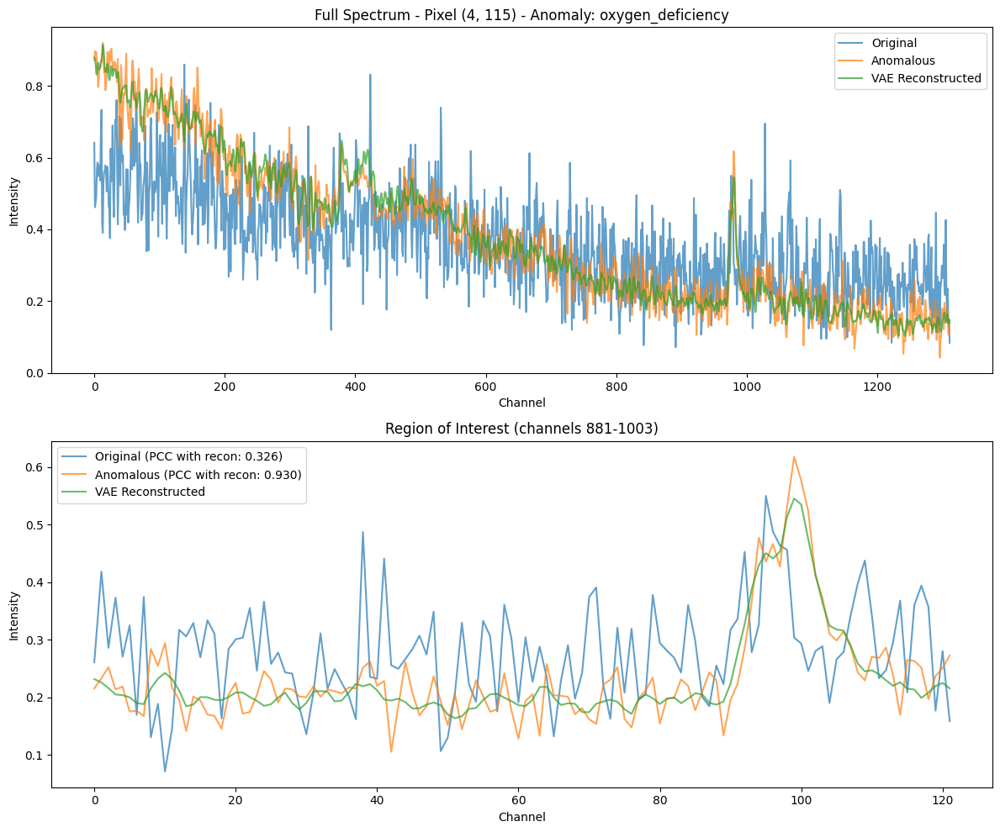

Original energy points: 1340
Adjusted energy points: 1312
Original energy points: 1312
Adjusted energy points: 1312


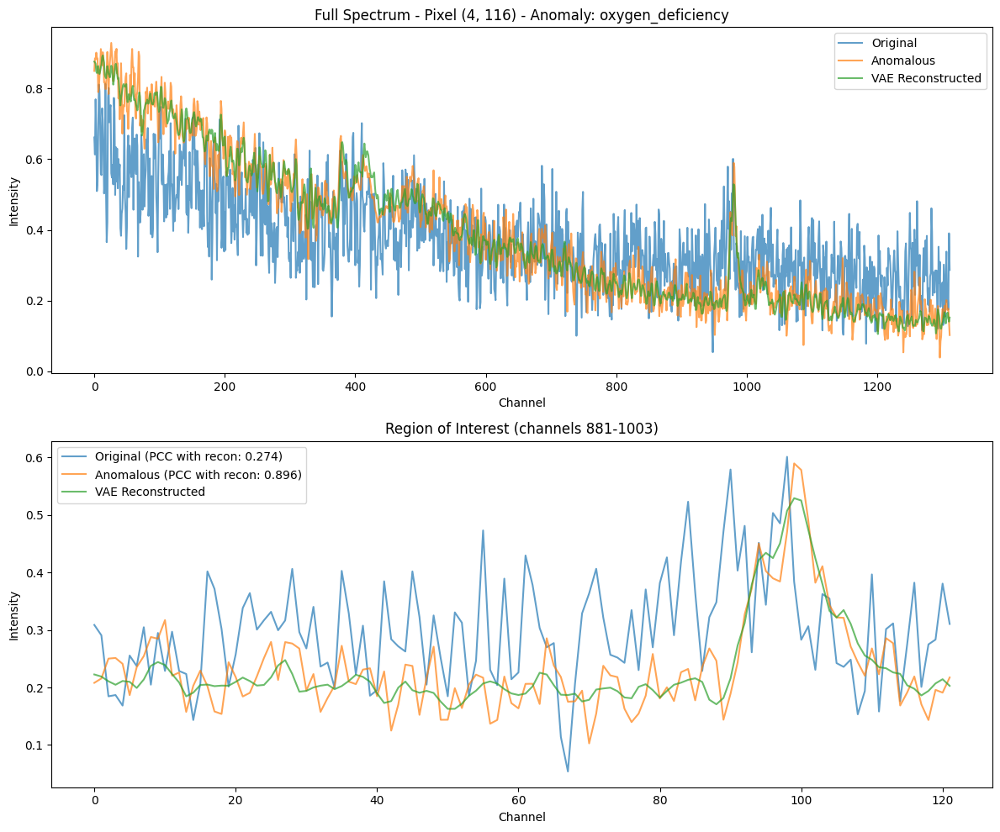

Original energy points: 1340
Adjusted energy points: 1312
Original energy points: 1312
Adjusted energy points: 1312


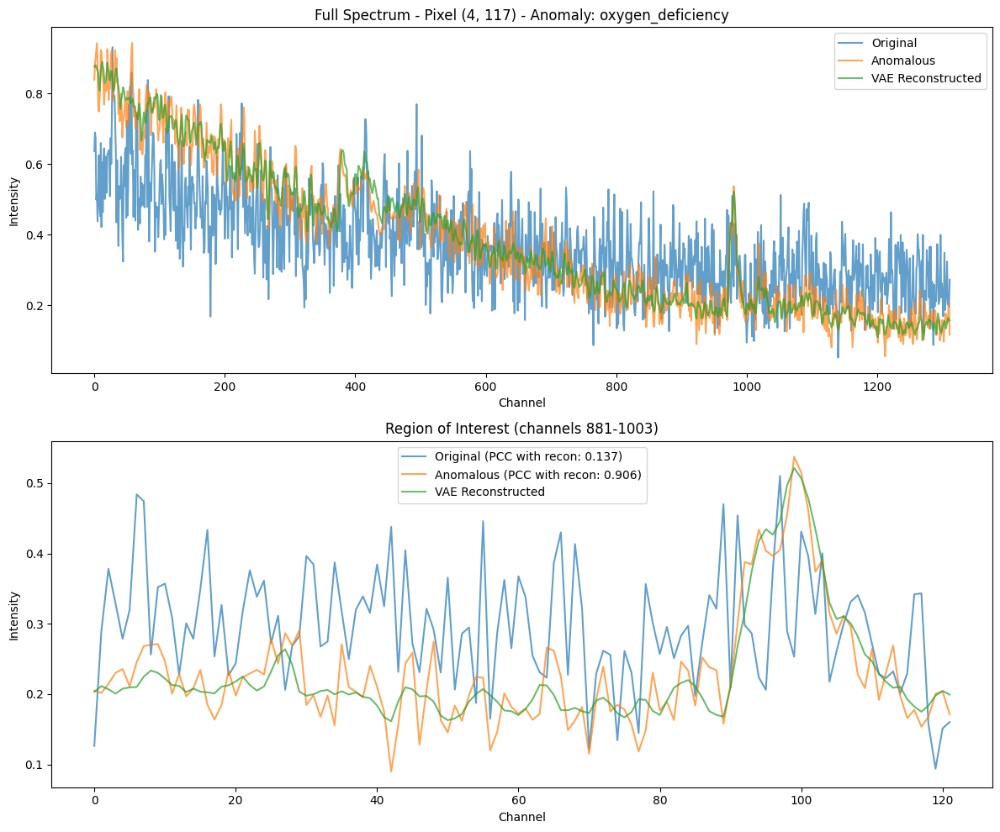

Original energy points: 1340
Adjusted energy points: 1312
Original energy points: 1312
Adjusted energy points: 1312


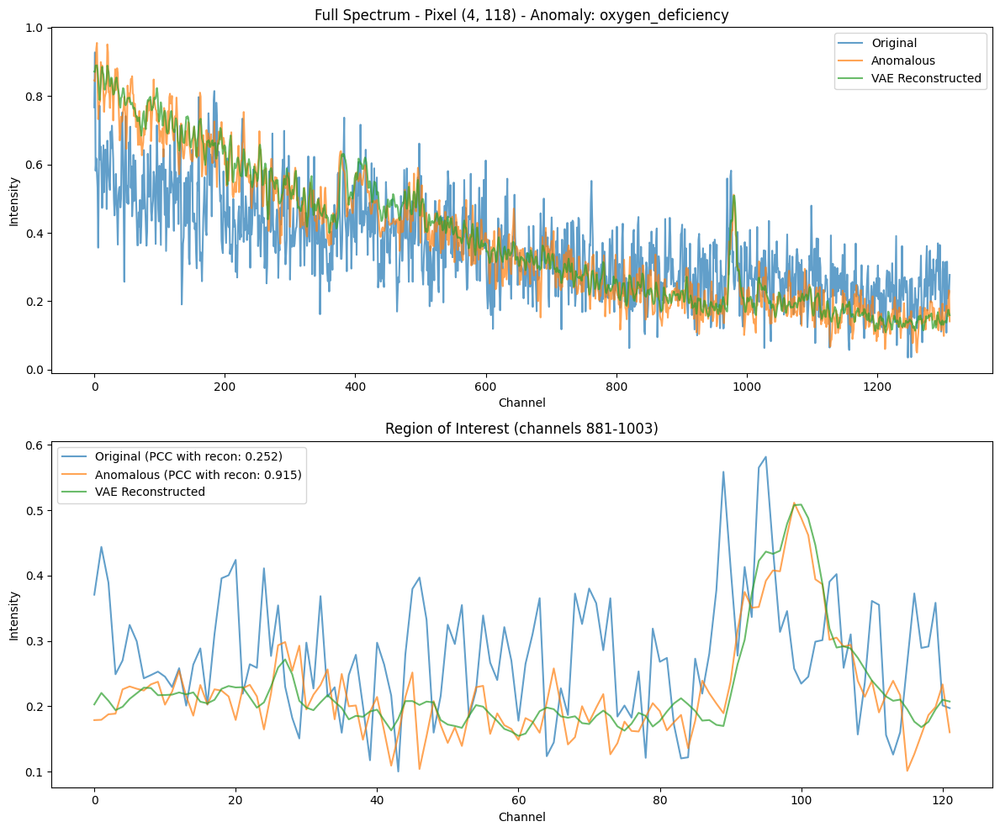

Original energy points: 1340
Adjusted energy points: 1312
Original energy points: 1312
Adjusted energy points: 1312


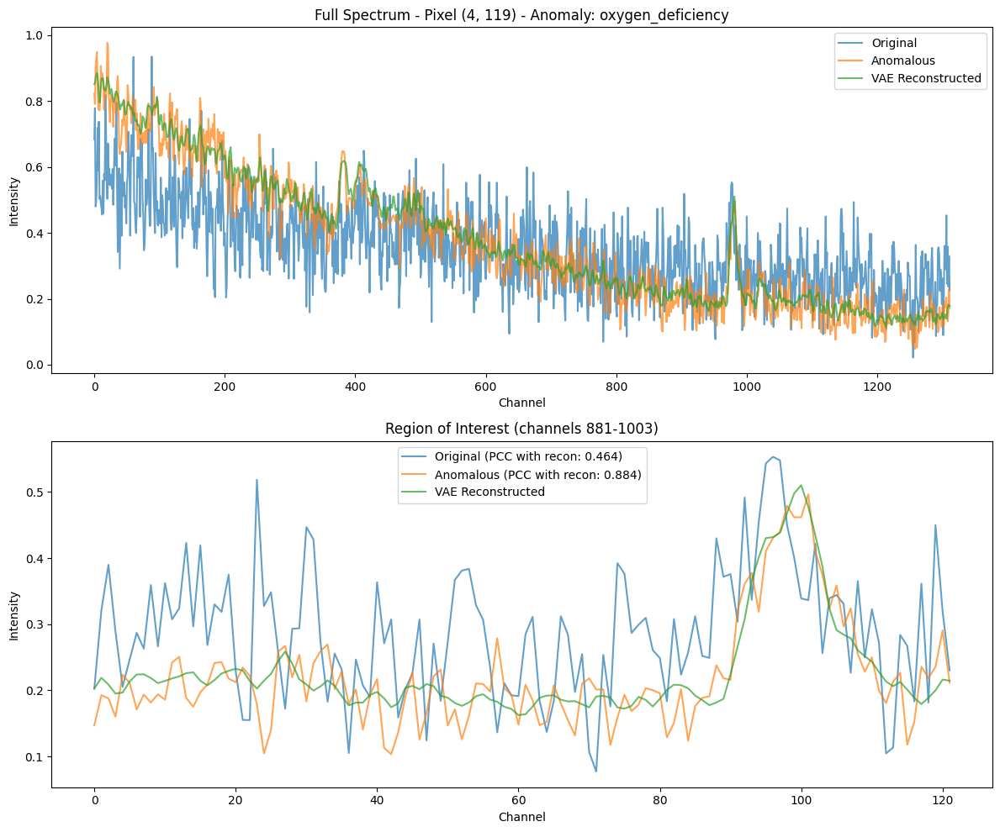

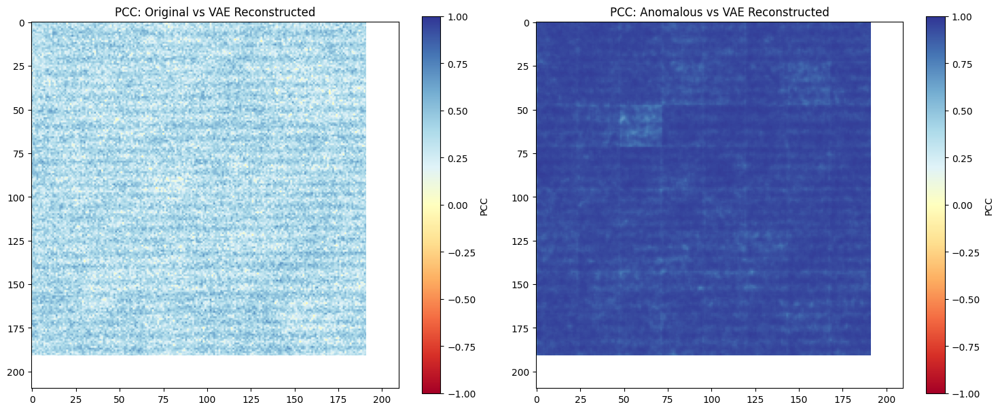

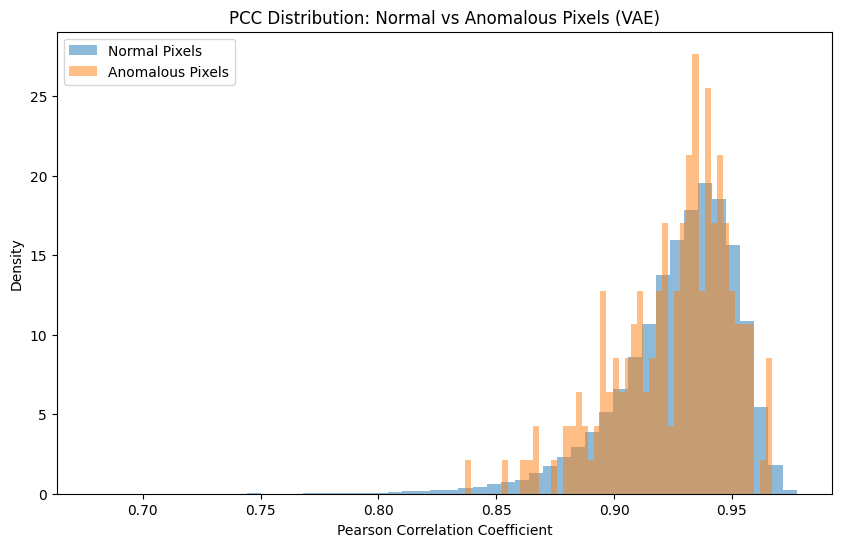


PCC Statistics:
Mean PCC for normal pixels: nan
Mean PCC for anomalous pixels: 0.926


In [13]:
import numpy as np
import torch
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
from tqdm import tqdm

def adjust_energy_dimension(data, target_points=1312):
    """
    Adjust the energy dimension of the data to exactly 1312 points
    by centering around the middle of the available range
    
    Args:
        data: numpy array of shape (height, width, energy_points)
        target_points: desired number of points in energy dimension (default: 1312)
    
    Returns:
        adjusted_data: numpy array with energy dimension of exactly target_points
    """
    height, width, energy_points = data.shape
    
    # Find the middle point of the current energy range
    mid_idx = energy_points // 2
    half_target = target_points // 2
    
    # Calculate start and end indices
    start_idx = max(0, mid_idx - half_target)
    end_idx = min(energy_points, start_idx + target_points)
    
    # If we hit the upper bound, adjust the start index
    if end_idx == energy_points:
        start_idx = end_idx - target_points
    # If we hit the lower bound, adjust the end index
    elif start_idx == 0:
        end_idx = target_points
    
    # Crop the data
    adjusted_data = data[..., start_idx:end_idx]
    
    print(f"Original energy points: {energy_points}")
    print(f"Adjusted energy points: {adjusted_data.shape[-1]}")
    
    return adjusted_data

def split_into_shards(data, shard_size=24, target_energy_points=1312):
    """
    Split data into 24x24 shards with exactly 1312 energy points
    
    Args:
        data: numpy array of shape (height, width, energy_points)
        shard_size: size of each square shard
        target_energy_points: desired number of points in energy dimension
    
    Returns:
        shards: list of numpy arrays, each of shape (shard_size, shard_size, target_energy_points)
        positions: list of tuples containing (i, j) start positions of each shard
    """
    # First adjust the energy dimension
    adjusted_data = adjust_energy_dimension(data, target_energy_points)
    height, width, energy_points = adjusted_data.shape
    
    assert energy_points == target_energy_points, f"Energy dimension should be {target_energy_points}, got {energy_points}"
    
    shards = []
    positions = []
    
    # Calculate number of complete shards in each dimension
    n_shards_h = height // shard_size
    n_shards_w = width // shard_size
    
    print(f"Input data shape after energy adjustment: {adjusted_data.shape}")
    print(f"Will create {n_shards_h * n_shards_w} complete shards of size {shard_size}x{shard_size}")
    
    for i in range(0, height - shard_size + 1, shard_size):
        for j in range(0, width - shard_size + 1, shard_size):
            # Extract shard
            shard = adjusted_data[i:i+shard_size, j:j+shard_size, :]
            
            # Only add if it's a complete shard
            if shard.shape == (shard_size, shard_size, target_energy_points):
                shards.append(shard)
                positions.append((i, j))
    
    # Print information about the shards
    if len(shards) > 0:
        print(f"Individual shard shape: {shards[0].shape}")
    print(f"Number of shards created: {len(shards)}")
    
    return shards, positions

def reconstruct_from_shards(shards, positions, full_shape, shard_size=24):
    """
    Reconstruct full image from shards
    
    Args:
        shards: list of numpy arrays of shape (shard_size, shard_size, energy_points)
        positions: list of tuples containing (i, j) start positions
        full_shape: tuple of (height, width, energy_points)
        shard_size: size of each square shard
    
    Returns:
        reconstructed: numpy array of shape full_shape
    """
    height, width, energy_points = full_shape
    reconstructed = np.zeros(full_shape)
    
    for shard, (i, j) in zip(shards, positions):
        reconstructed[i:i+shard_size, j:j+shard_size, :] = shard
    
    return reconstructed

def calculate_pcc(spec1, spec2, range_start=900, range_end=1025):
    """Calculate Pearson Correlation Coefficient for spectra within specified range"""
    spec1_range = spec1[range_start:range_end]
    spec2_range = spec2[range_start:range_end]
    pcc, _ = pearsonr(spec1_range, spec2_range)
    return pcc

def calculate_pcc_map(data1, data2, range_start=900, range_end=1025):
    """Calculate PCC map for two datasets"""
    shape = data1.shape[:-1]
    pcc_map = np.zeros(shape)
    
    for i in range(shape[0]):
        for j in range(shape[1]):
            pcc_map[i,j] = calculate_pcc(data1[i,j], data2[i,j], range_start, range_end)
    
    return pcc_map

def plot_spectra_comparison(original_data, anomalous_data, reconstructed_data, coord, 
                          range_start=900, range_end=1025):
    y, x = coord
    anomaly_type = list(anomaly_types.keys())[list(anomaly_types.values()).index(anomaly_mask[y, x])]
    
    # Get spectra
    orig_spec = original_data[y, x]
    anom_spec = anomalous_data[y, x]
    recon_spec = reconstructed_data[y, x]
    
    # Calculate PCCs
    pcc_orig_recon = calculate_pcc(orig_spec, recon_spec, range_start, range_end)
    pcc_anom_recon = calculate_pcc(anom_spec, recon_spec, range_start, range_end)
    
    # Plot
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10))
    
    # Full spectrum
    ax1.plot(orig_spec, label='Original', alpha=0.7)
    ax1.plot(anom_spec, label='Anomalous', alpha=0.7)
    ax1.plot(recon_spec, label=f'VAE Reconstructed', alpha=0.7)
    ax1.legend()
    ax1.set_title(f'Full Spectrum - Pixel ({y}, {x}) - Anomaly: {anomaly_type}')
    ax1.set_xlabel('Channel')
    ax1.set_ylabel('Intensity')
    
    # Region of interest
    ax2.plot(orig_spec[range_start:range_end], 
             label=f'Original (PCC with recon: {pcc_orig_recon:.3f})', alpha=0.7)
    ax2.plot(anom_spec[range_start:range_end], 
             label=f'Anomalous (PCC with recon: {pcc_anom_recon:.3f})', alpha=0.7)
    ax2.plot(recon_spec[range_start:range_end], label='VAE Reconstructed', alpha=0.7)
    ax2.legend()
    ax2.set_title(f'Region of Interest (channels {range_start}-{range_end})')
    ax2.set_xlabel('Channel')
    ax2.set_ylabel('Intensity')
    
    plt.tight_layout()
    plt.show()

def process_data_with_vae(data, model, device, shard_size=24, target_energy_points=1312):
    """Process entire dataset through VAE using shards"""
    # First adjust the energy dimension
    adjusted_data = adjust_energy_dimension(data, target_energy_points)
    
    # Split adjusted data into shards
    shards, positions = split_into_shards(adjusted_data, shard_size)
    reconstructed_shards = []
    
    print("Processing shards through VAE...")
    for shard in tqdm(shards):
        # Process through VAE
        with torch.no_grad():
            shard_tensor = torch.tensor(shard).unsqueeze(0).unsqueeze(0).float().to(device)
            mean, logvar = model.encode(shard_tensor)
            z = model.reparameterize(mean, logvar)
            reconstructed_shard = model.decode(z).squeeze().cpu().numpy()
            reconstructed_shards.append(reconstructed_shard)
    
    # Reconstruct full image using adjusted shape
    height, width, _ = adjusted_data.shape
    adjusted_shape = (height, width, target_energy_points)
    reconstructed_data = reconstruct_from_shards(reconstructed_shards, positions, adjusted_shape)
    
    return reconstructed_data

def analyze_vae_reconstruction(original_data, anomalous_data, model, device, 
                             anomaly_mask, anomaly_coords, range_start=900, range_end=1025):
    """Perform complete VAE reconstruction analysis"""
    
    # Process original data
    print("Processing original data through VAE...")
    reconstructed_original = process_data_with_vae(original_data, model, device)
    
    # Process anomalous data
    print("Processing anomalous data through VAE...")
    reconstructed_anomalous = process_data_with_vae(anomalous_data, model, device)
    
    # Adjust range_start and range_end for the new energy dimension
    original_length = original_data.shape[-1]
    target_length = 1312
    scale_factor = target_length / original_length
    
    adjusted_range_start = int(range_start * scale_factor)
    adjusted_range_end = int(range_end * scale_factor)
    
    print(f"Adjusted analysis range: {adjusted_range_start}-{adjusted_range_end}")
    
    # Calculate PCC maps with adjusted ranges
    print("Calculating PCC maps...")
    pcc_map_orig = calculate_pcc_map(
        adjust_energy_dimension(original_data), 
        reconstructed_original, 
        adjusted_range_start, 
        adjusted_range_end
    )
    
    pcc_map_anom = calculate_pcc_map(
        adjust_energy_dimension(anomalous_data), 
        reconstructed_anomalous, 
        adjusted_range_start, 
        adjusted_range_end
    )
    
    # Plot example spectra
    print("\nPlotting spectra for pixels with anomalies:")
    for i in range(min(5, len(anomaly_coords))):
        coord = anomaly_coords[i]
        plot_spectra_comparison(
            adjust_energy_dimension(original_data),
            adjust_energy_dimension(anomalous_data),
            reconstructed_anomalous,
            coord,
            adjusted_range_start,
            adjusted_range_end
        )
    
    # Plot PCC maps
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    
    im1 = ax1.imshow(pcc_map_orig, cmap='RdYlBu', vmin=-1, vmax=1)
    plt.colorbar(im1, ax=ax1, label='PCC')
    ax1.set_title('PCC: Original vs VAE Reconstructed')
    
    im2 = ax2.imshow(pcc_map_anom, cmap='RdYlBu', vmin=-1, vmax=1)
    plt.colorbar(im2, ax=ax2, label='PCC')
    ax2.set_title('PCC: Anomalous vs VAE Reconstructed')
    
    plt.tight_layout()
    plt.show()
    
    # Create PCC histograms
    plt.figure(figsize=(10, 6))
    
    plt.hist(pcc_map_anom[anomaly_mask == 0].flatten(), 
             bins=50, alpha=0.5, label='Normal Pixels', density=True)
    plt.hist(pcc_map_anom[anomaly_mask > 0].flatten(), 
             bins=50, alpha=0.5, label='Anomalous Pixels', density=True)
    
    plt.xlabel('Pearson Correlation Coefficient')
    plt.ylabel('Density')
    plt.title('PCC Distribution: Normal vs Anomalous Pixels (VAE)')
    plt.legend()
    plt.show()
    
    # Print summary statistics
    print("\nPCC Statistics:")
    print(f"Mean PCC for normal pixels: {np.mean(pcc_map_anom[anomaly_mask == 0]):.3f}")
    print(f"Mean PCC for anomalous pixels: {np.mean(pcc_map_anom[anomaly_mask > 0]):.3f}")
    
    return reconstructed_original, reconstructed_anomalous, pcc_map_orig, pcc_map_anom

from anomaly_detection.models.cvae3d import CVAE3D

# Load your configuration
config = get_config('/home/ssulta24/Desktop/VCAE_new/anomaly_detection/config/config.yaml')

# Load your pretrained model V2
model = CVAE3D(config).to("cuda")
model.load_state_dict(torch.load('/home/ssulta24/Desktop/VCAE_new/wandb/run-20241006_160824-x3tu4esv/files/best_model.pth', map_location="cuda")) # best loss 
model.eval()
device = "cuda"

# Run the analysis
reconstructed_original, reconstructed_anomalous, pcc_map_orig, pcc_map_anom = analyze_vae_reconstruction(
    SI_raw.data, 
    anomalous_image, 
    model,  # Your VAE model
    device,
    anomaly_mask,
    anomaly_coords,
    range_start=900,
    range_end=1025
)